<a href="https://colab.research.google.com/github/chetan015/ganex/blob/main/BasicGan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Build and train a GAN that can generate hand-written images of digits (0-9) using [PyTorch](https://pytorch.org/docs/stable/index.html). 

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

**Generator**
Create a function to make a single layer/block for generator's NN, each having a linear transformation, BN, and finally a non-linear activation - ReLU.

In [2]:
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )

In [3]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
  block = get_generator_block(in_features, out_features)
  # Check the three parts
  assert len(block) == 3
  assert type(block[0]) == nn.Linear
  assert type(block[1]) == nn.BatchNorm1d
  assert type(block[2]) == nn.ReLU
  
  # Check the output shape
  test_input = torch.randn(num_test, in_features)
  test_output = block(test_input)
  assert tuple(test_output.shape) == (num_test, out_features)
  assert test_output.std() > 0.55
  assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Building the generator class. It takes 3 values:


*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

A generator NN with 5 blocks is built. Beginning with the noise vector, non-linear transformations are applied via the block function until the output tensor is mapped to the size of the image to be outputted. Final layer does not apply BN or activation, but is scaled with a sigmoid function.

The forward pass function takes in a noise vector and generates an image of the outpput dimension using the NN.



In [4]:
class Generator(nn.Module):
    '''
      Generator Class
      Values:
          z_dim: the dimension of the noise vector, a scalar
          im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28 x 28 = 784 so that is your default)
          hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10,im_dim=784,hidden_dim=128):
      super(Generator,self).__init__()
      self.gen = nn.Sequential(get_generator_block(z_dim, hidden_dim),
                               get_generator_block(hidden_dim,hidden_dim*2),
                               get_generator_block(hidden_dim * 2, hidden_dim * 4),
                               get_generator_block(hidden_dim * 4, hidden_dim * 8),
                               nn.Linear(hidden_dim * 8,im_dim),
                               nn.Sigmoid()
                               )
    def forward(self, noise):
      '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
      return self.gen(noise)
    
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [5]:
def test_generator(z_dim, im_dim, hidden_dim, num_test = 10000):
  gen = Generator(z_dim, im_dim, hidden_dim).get_gen()

  # Check there are six modules in the sequential part
  assert len(gen) == 6
  assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim*8},out_features={im_dim},bias=True)'
  assert str(gen.__getitem__(5)).replace(' ', '') == f'Sigmoid()'
  test_input = torch.randn(num_test, z_dim)
  test_output = gen(test_input)

  # Check that the output shape is correct
  assert tuple(test_output.shape) == (num_test, im_dim)
  assert test_output.max() < 1 , "Make sure to use a sigmoid"
  assert test_output.min() > 0 , "Make sure to use a sigmoid"
  assert test_output.std() > 0.05 , "Dont use batchnorm here"
  assert test_output.std() < 0.15 , "Dont use batchnorm here"
test_generator(5,10,20)
test_generator(20,8,24)
print("Success!")


Success!


Creating Noise Vectors

In [6]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)
    

In [7]:
# Verify the noise vector function
def test_get_noise(n_samples,z_dim,device='cpu'):
  noise = get_noise(n_samples,z_dim,device)

  # Make sure a normal distribution was used
  assert tuple(noise.shape) == (n_samples, z_dim)
  assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
  assert str(noise.device) == device

test_get_noise(1000, 100, 'cpu')
try:
  test_get_noise(1000, 32, 'cuda')
except Exception as e:
  print(e)
print("Success!")


Success!


**Discriminator**

Building the next component of a GAN, a discriminator NN.

In [8]:
def get_discriminator_block(input_dim, output_dim):
  '''
  Discriminator Block
  Function for returning a neural network of the discriminator given input and output dimensions.
  Parameters:
      input_dim: the dimension of the input vector, a scalar
      output_dim: the dimension of the output vector, a scalar
  Returns:
      a discriminator neural network layer, with a linear transformation 
        followed by an nn.LeakyReLU activation with negative slope of 0.2 
        (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
  '''
  return nn.Sequential(
      nn.Linear(input_dim, output_dim),
      nn.LeakyReLU(0.2)
  )

In [9]:
def test_disc_block(in_features, out_features, num_test = 10000):
  block = get_discriminator_block(in_features, out_features)

  # Check there are two parts
  assert len(block) == 2
  test_input = torch.randn(num_test, in_features)
  test_output = block(test_input)

  # Check that the shape is right
  assert tuple(test_output.shape) == (num_test, out_features)

  # Check that the LeakyReLU slope is about 0.2
  assert -test_output.min() / test_output.max() > 0.1
  assert -test_output.min() / test_output.max() < 0.3
  assert test_output.std() > 0.3
  assert test_output.std() < 0.5
test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Create the discriminator class, which holds two values:
*   Image dimension
*   Hidden dimension

In [10]:
class Discriminator(nn.Module):
  '''
  Discriminator Class
  Values:
      im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28x28 = 784 so that is your default)
      hidden_dim: the inner dimension, a scalar
  '''
  def __init__(self, im_dim=784, hidden_dim=128):
    super(Discriminator, self).__init__()
    self.disc = nn.Sequential(
        get_discriminator_block(im_dim, hidden_dim*4),
        get_discriminator_block(hidden_dim*4, hidden_dim*2),
        get_discriminator_block(hidden_dim*2, hidden_dim),
        nn.Linear(hidden_dim, 1)
    )
  def forward(self, image):
    return self.disc(image)
  
  def get_disc(self):
    return self.disc

In [11]:
def test_discriminator(z_dim, hidden_dim, num_test=100):
  disc = Discriminator(z_dim, hidden_dim).get_disc()

  # Check there are three parts 
  assert len(disc) == 4
  assert type(disc.__getitem__(3)) == nn.Linear

  # Check the linear layer is correct
  test_input = torch.randn(num_test, z_dim)
  test_output = disc(test_input)
  assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


**Training**

In [12]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()),
                        batch_size=batch_size,shuffle=True)

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw
Processing...
Done!


/usr/local/lib/python3.6/dist-packages/torchvision/datasets/mnist.py:469: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


Initialize generator, discriminator, and optimizers.

In [13]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Create functions to calculate discriminator's and generator's loss.

In [14]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
  '''
  Return the loss of the discriminator given inputs.
  Parameters:
      gen: the generator model, which returns an image given z-dimensional noise
      disc: the discriminator model, which returns a single-dimensional prediction of real/fake
      criterion: the loss function, which should be used to compare 
              the discriminator's predictions to the ground truth reality of the images 
              (e.g. fake = 0, real = 1)
      real: a batch of real images
      num_images: the number of images the generator should produce, 
              which is also the length of the real images
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
  Returns:
      disc_loss: a torch scalar loss value for the current batch
  '''
  #     These are the steps you will need to complete:
  #       1) Create noise vectors and generate a batch (num_images) of fake images. 
  #            Make sure to pass the device argument to the noise.
  #       2) Get the discriminator's prediction of the fake image 
  #            and calculate the loss. Don't forget to detach the generator!
  #            (Remember the loss function you set earlier -- criterion. You need a 
  #            'ground truth' tensor in order to calculate the loss. 
  #            For example, a ground truth tensor for a fake image is all zeros.)
  #       3) Get the discriminator's prediction of the real image and calculate the loss.
  #       4) Calculate the discriminator's loss by averaging the real and fake loss
  #            and set it to disc_loss.
  #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
  fake_noise = get_noise(num_images, z_dim, device = device)
  fake = gen(fake_noise)
  disc_fake_pred = disc(fake.detach())
  disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
  disc_real_pred = disc(real)
  disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
  disc_loss = (disc_fake_loss + disc_real_loss) / 2
  return disc_loss


In [15]:
def test_disc_reasonable(num_images=10):
  gen = torch.zeros_like
  disc = nn.Identity()
  criterion = torch.mul # Multiply
  real = torch.ones(num_images, 1)
  assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu') - 0.5) < 1e-5)

  gen = torch.ones_like
  disc = nn.Identity()
  criterion = torch.mul # Multiply
  real = torch.zeros(num_images, 1)
  assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
  gen = Generator(z_dim).to(device)
  gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
  disc = Discriminator().to(device) 
  disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
  num_steps = 0
  for real, _ in dataloader:
    cur_batch_size = len(real)
    real = real.view(cur_batch_size, -1).to(device)

    ### Update discriminator ###
    # Zero out the gradient before backpropagation
    disc_opt.zero_grad()

    # Calculate discriminator loss
    disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
    assert (disc_loss - 0.68).abs() < 0.05

    # Update gradients
    disc_loss.backward(retain_graph=True)

    # Check that they detached correctly
    assert gen.gen[0][0].weight.grad is None

    # Update optimizer
    old_weight = disc.disc[0][0].weight.data.clone()
    disc_opt.step()
    new_weight = disc.disc[0][0].weight.data
    
    # Check that some discriminator weights changed
    assert not torch.all(torch.eq(old_weight, new_weight))
    num_steps += 1
    if num_steps >= max_tests:
      break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [16]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
  '''
  Return the loss of the generator given inputs.
  Parameters:
      gen: the generator model, which returns an image given z-dimensional noise
      disc: the discriminator model, which returns a single-dimensional prediction of real/fake
      criterion: the loss function, which should be used to compare 
              the discriminator's predictions to the ground truth reality of the images 
              (e.g. fake = 0, real = 1)
      num_images: the number of images the generator should produce, 
              which is also the length of the real images
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
  Returns:
      gen_loss: a torch scalar loss value for the current batch
  '''
  #     These are the steps you will need to complete:
  #       1) Create noise vectors and generate a batch of fake images. 
  #           Remember to pass the device argument to the get_noise function.
  #       2) Get the discriminator's prediction of the fake image.
  #       3) Calculate the generator's loss. Remember the generator wants
  #          the discriminator to think that its fake images are real
  #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
  fake_noise = get_noise(num_images, z_dim, device = device)
  fake = gen(fake_noise)
  disc_fake_pred = disc(fake)
  gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
  return gen_loss


In [17]:
def test_gen_reasonable(num_images=10):
  gen = torch.zeros_like
  disc = nn.Identity()
  criterion = torch.mul # Multiply
  assert torch.all(torch.abs(get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')) < 1e-5)

  gen = torch.ones_like
  disc = nn.Identity()
  criterion = torch.mul # Multiply
  real = torch.zeros(num_images, 1)
  assert torch.all(torch.abs(get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu') - 1) < 1e-5)

def test_gen_loss(num_images):
  gen = Generator(z_dim).to(device)
  gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
  disc = Discriminator().to(device) 
  disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
  
  gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
  
  # Check that the loss is reasonable
  assert (gen_loss - 0.7).abs() < 0.1
  gen_loss.backward()
  old_weight = gen.gen[0][0].weight.clone()
  gen_opt.step()
  new_weight = gen.gen[0][0].weight
  assert not torch.all(torch.eq(old_weight, new_weight))

test_gen_reasonable()
test_gen_loss(18)
print("Success!")

Success!


For each epoch, the entire dataset is processed in batches. For every batch, the discriminator and generator should be updated using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated. Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess.
It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN.

Step 500: Generator loss: 1.4034421577453617, discriminator loss: 0.41599215817451496


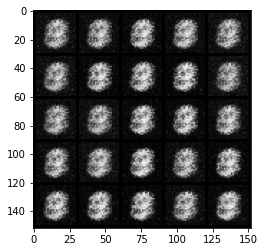

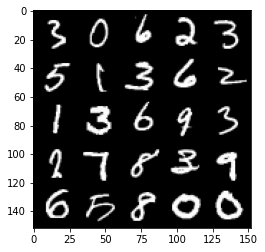

Step 1000: Generator loss: 1.7559466178417211, discriminator loss: 0.2782213543653488


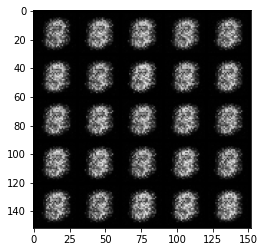

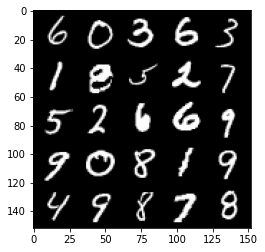

Step 1500: Generator loss: 2.049242857694624, discriminator loss: 0.16084290969371803


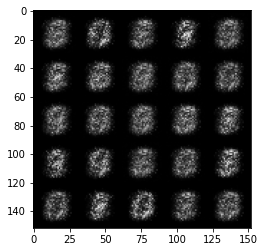

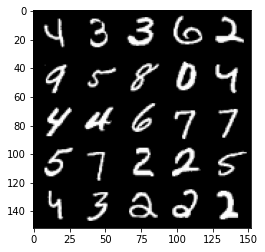

Step 2000: Generator loss: 1.6575819582939146, discriminator loss: 0.22918621930480013


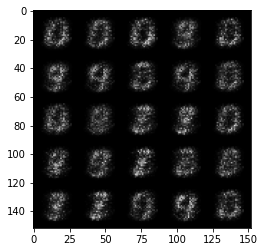

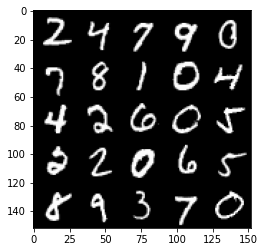

Step 2500: Generator loss: 1.6697917664051045, discriminator loss: 0.2029581127464772


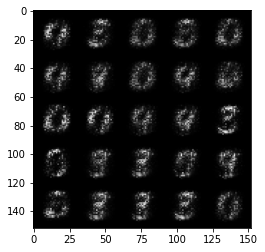

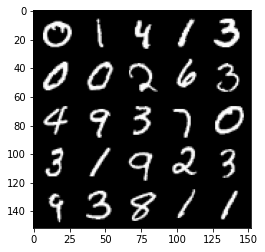

Step 3000: Generator loss: 1.8812911434173583, discriminator loss: 0.1772931003570557


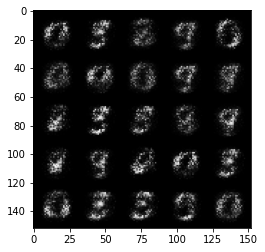

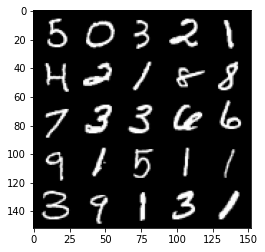

Step 3500: Generator loss: 2.2843459949493403, discriminator loss: 0.1419676358401776


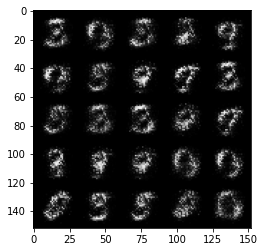

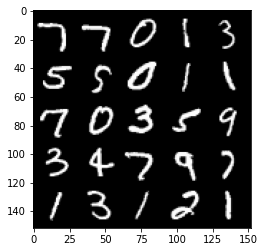

Step 4000: Generator loss: 2.7141168851852395, discriminator loss: 0.10561146181821822


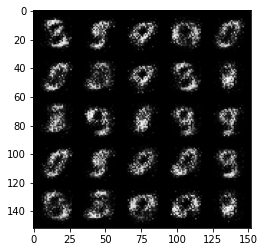

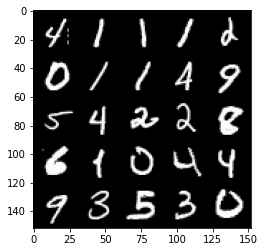

Step 4500: Generator loss: 3.215970798492427, discriminator loss: 0.07972435811907054


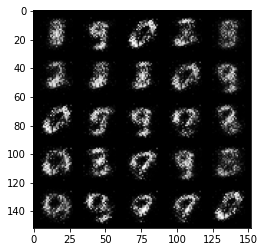

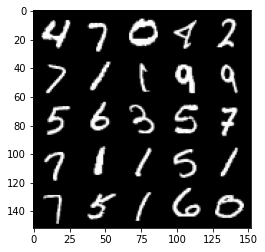

Step 5000: Generator loss: 3.4839833321571336, discriminator loss: 0.06589655417203898


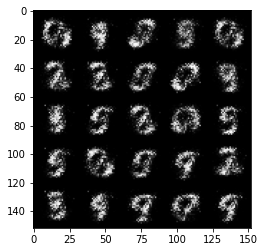

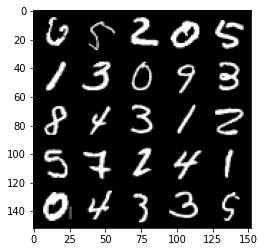

Step 5500: Generator loss: 3.8085143222808866, discriminator loss: 0.05592245943844317


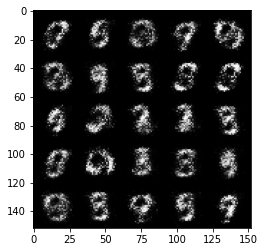

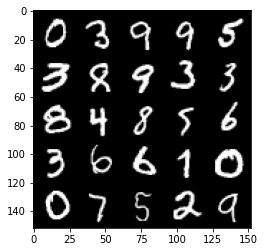

Step 6000: Generator loss: 4.0549151978492715, discriminator loss: 0.05215448904037474


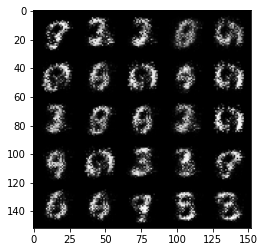

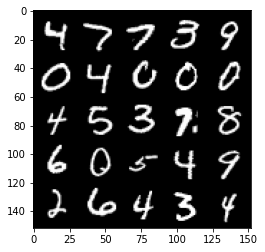

Step 6500: Generator loss: 4.082262071132658, discriminator loss: 0.054469852499663886


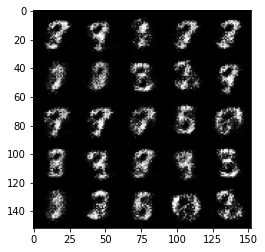

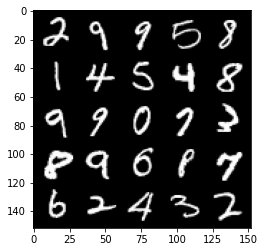

Step 7000: Generator loss: 4.2552362813949545, discriminator loss: 0.04972139401733871


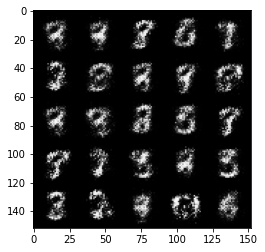

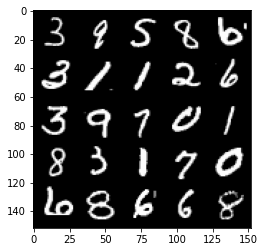

Step 7500: Generator loss: 4.291512780666353, discriminator loss: 0.0532051535658538


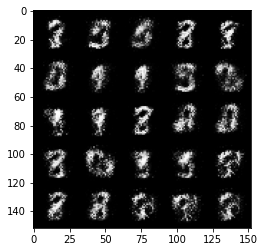

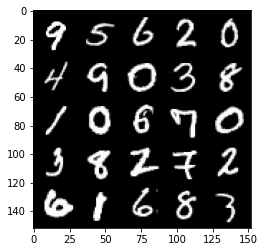

Step 8000: Generator loss: 4.499913409709931, discriminator loss: 0.04928683562204243


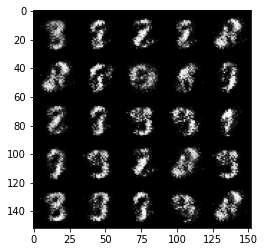

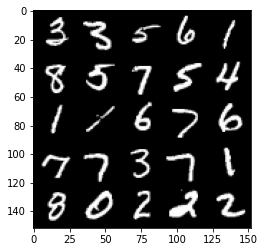

Step 8500: Generator loss: 4.597667886257171, discriminator loss: 0.04203235782682895


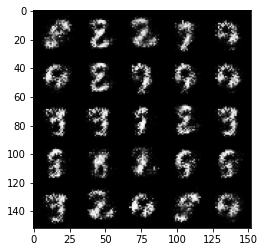

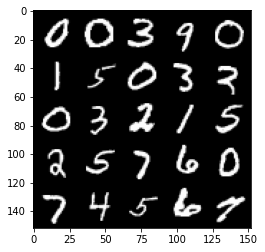

Step 9000: Generator loss: 4.486980804920195, discriminator loss: 0.03724003671482205


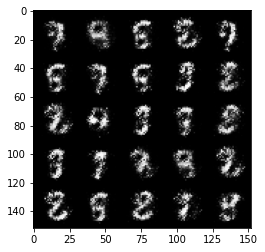

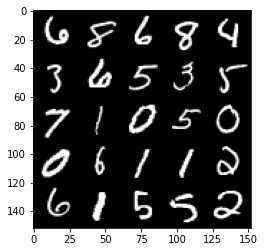

Step 9500: Generator loss: 4.537365991115574, discriminator loss: 0.04623176426440475


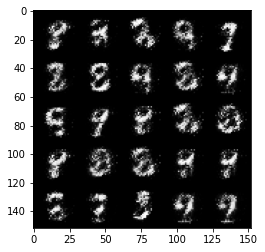

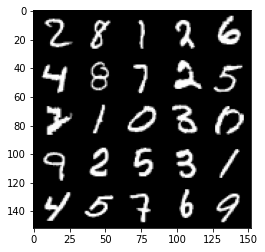

Step 10000: Generator loss: 4.679620065212251, discriminator loss: 0.045679479327052866


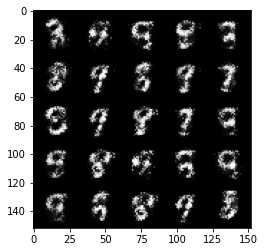

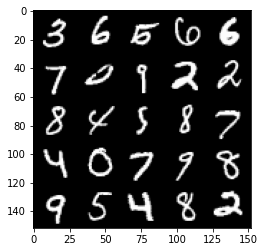

Step 10500: Generator loss: 4.706381741523744, discriminator loss: 0.050231080792844295


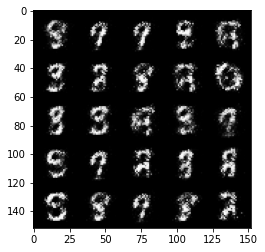

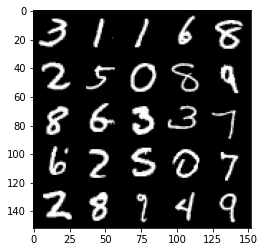

Step 11000: Generator loss: 4.5689947829246575, discriminator loss: 0.05394030039012437


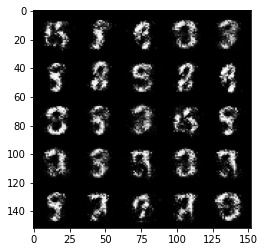

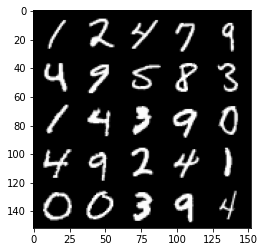

Step 11500: Generator loss: 4.633751870155334, discriminator loss: 0.056086861453950365


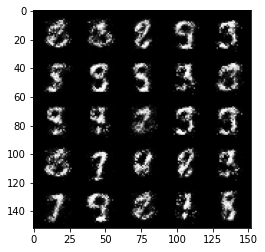

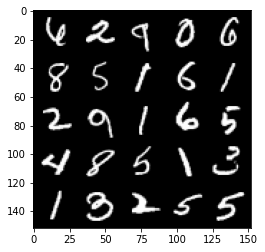

Step 12000: Generator loss: 4.301906032562259, discriminator loss: 0.06472016372531653


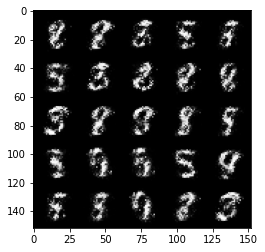

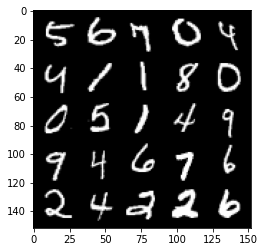

Step 12500: Generator loss: 4.392491232872014, discriminator loss: 0.06209787109866731


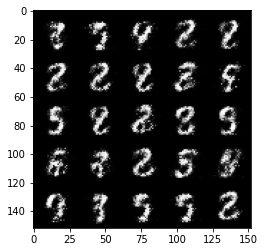

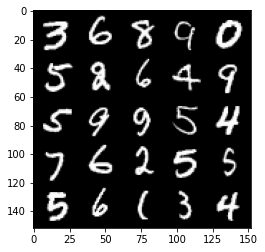

Step 13000: Generator loss: 4.358800584793087, discriminator loss: 0.06294014678895461


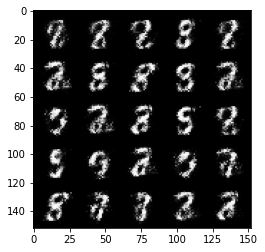

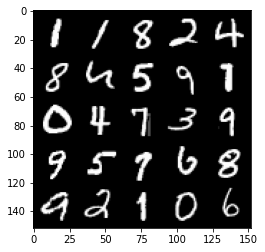

Step 13500: Generator loss: 4.2810487718582175, discriminator loss: 0.07958376486599443


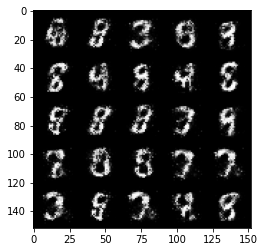

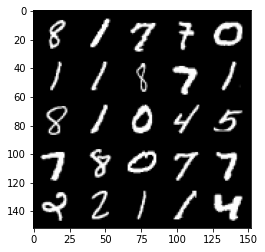

Step 14000: Generator loss: 4.092504155158997, discriminator loss: 0.08804741934686895


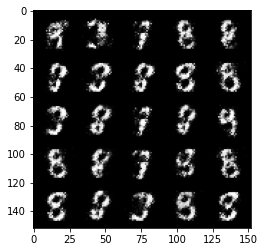

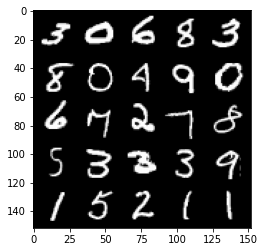

Step 14500: Generator loss: 4.137795050621029, discriminator loss: 0.0875866407714784


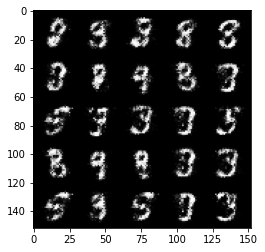

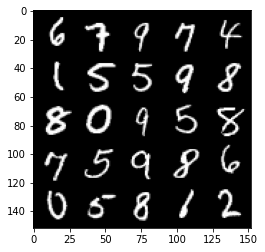

Step 15000: Generator loss: 4.149182322502136, discriminator loss: 0.0924736013710498


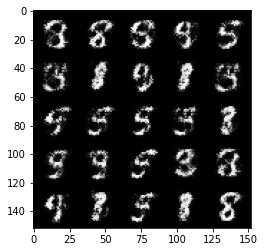

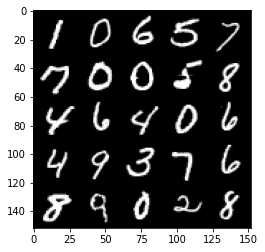

Step 15500: Generator loss: 3.9869438519477836, discriminator loss: 0.09765231996029618


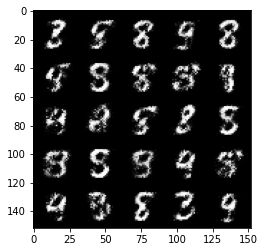

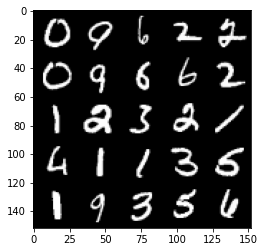

Step 16000: Generator loss: 4.031640973091127, discriminator loss: 0.1102547358423472


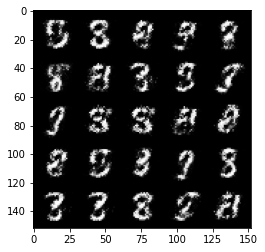

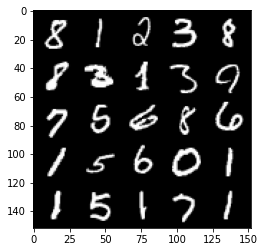

Step 16500: Generator loss: 4.012320425510405, discriminator loss: 0.09897527555376291


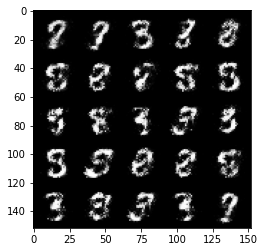

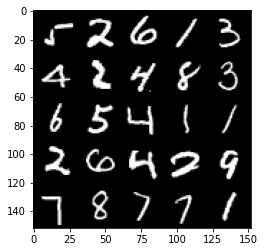

Step 17000: Generator loss: 3.842480200290676, discriminator loss: 0.12787232770025742


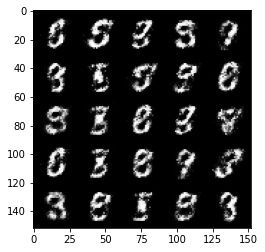

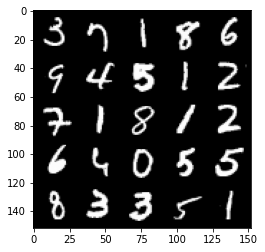

Step 17500: Generator loss: 3.7929407339096093, discriminator loss: 0.12333573752641683


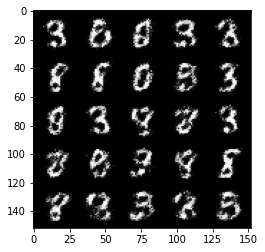

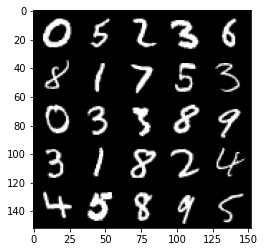

Step 18000: Generator loss: 3.816581254005428, discriminator loss: 0.11610579430311918


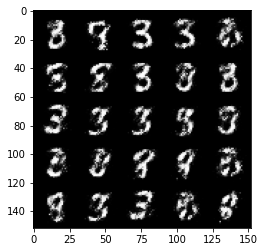

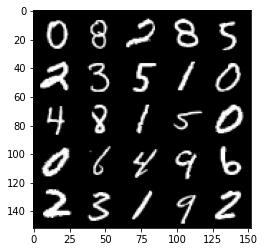

Step 18500: Generator loss: 3.8019549655914284, discriminator loss: 0.1365767190903427


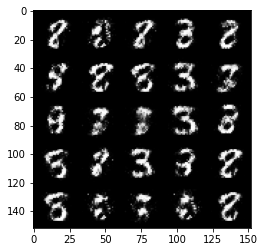

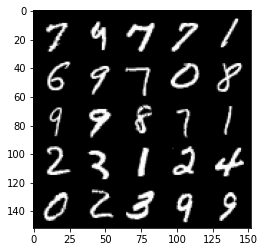

Step 19000: Generator loss: 3.795614253997801, discriminator loss: 0.11678093506395823


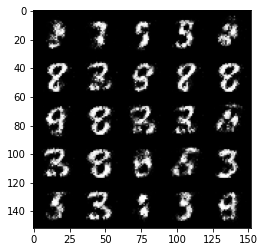

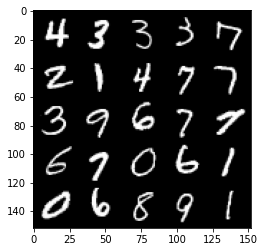

Step 19500: Generator loss: 3.667313324928289, discriminator loss: 0.13113527044653903


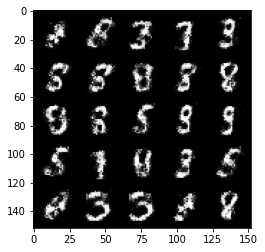

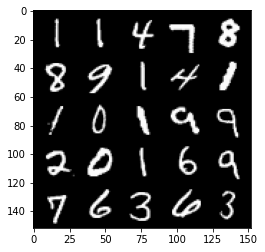

Step 20000: Generator loss: 3.5748754782676664, discriminator loss: 0.13087882074713705


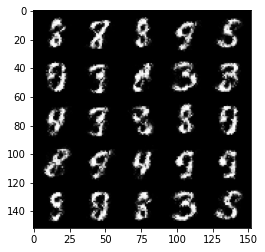

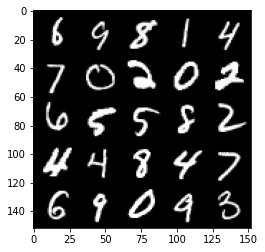

Step 20500: Generator loss: 3.41019072151184, discriminator loss: 0.1420935199707746


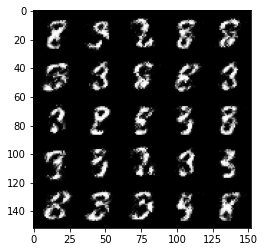

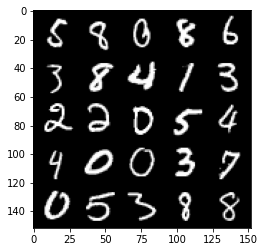

Step 21000: Generator loss: 3.350883358955382, discriminator loss: 0.1419513327777386


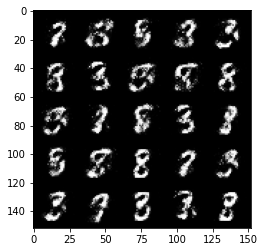

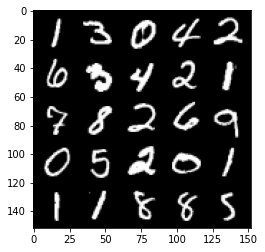

Step 21500: Generator loss: 3.3605007610321054, discriminator loss: 0.13753901290893555


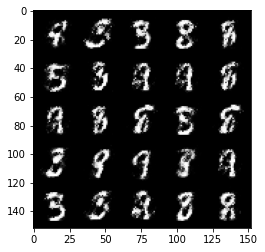

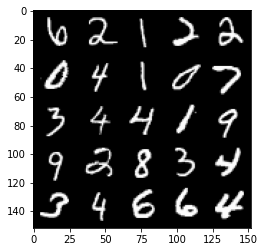

Step 22000: Generator loss: 3.351093297004699, discriminator loss: 0.1578585307747125


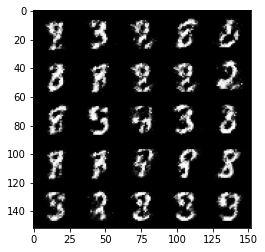

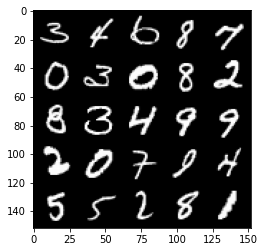

Step 22500: Generator loss: 3.0722700648307804, discriminator loss: 0.1679543742686511


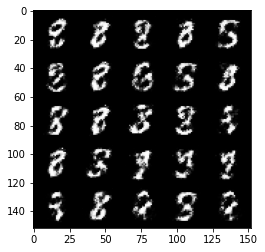

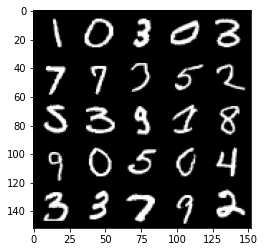

Step 23000: Generator loss: 3.1647999219894376, discriminator loss: 0.15672446900606166


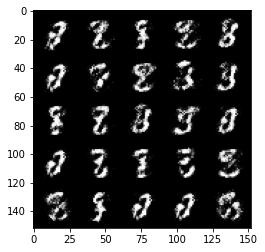

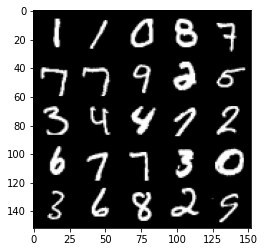

Step 23500: Generator loss: 3.1672976493835474, discriminator loss: 0.16586811906099308


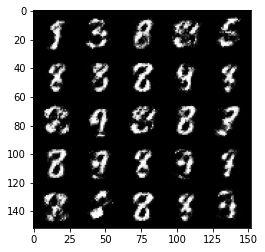

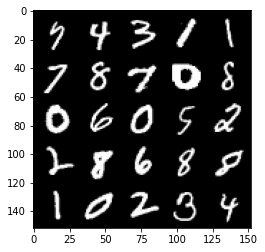

Step 24000: Generator loss: 3.0230061450004584, discriminator loss: 0.1714176826179028


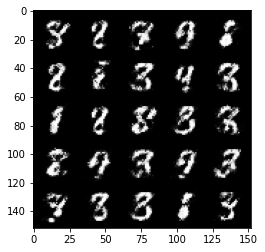

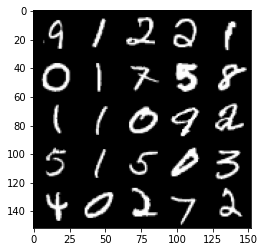

Step 24500: Generator loss: 3.05271594953537, discriminator loss: 0.16251915250718588


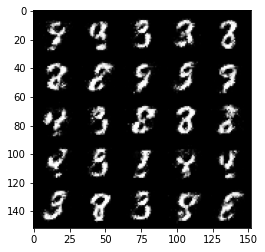

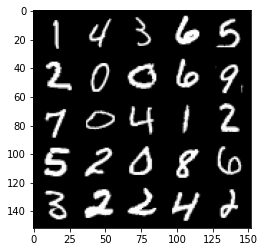

Step 25000: Generator loss: 3.0381509671211258, discriminator loss: 0.1559575212001799


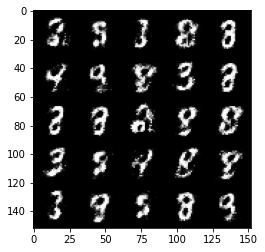

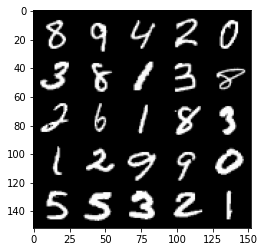

Step 25500: Generator loss: 2.8911734628677404, discriminator loss: 0.19235285840928548


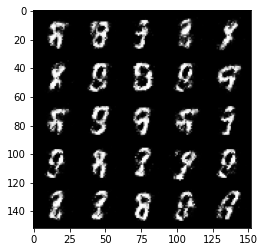

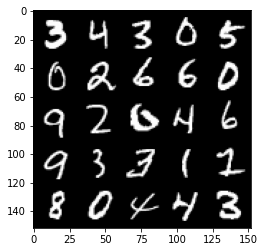

Step 26000: Generator loss: 2.877367467403412, discriminator loss: 0.18537027044594298


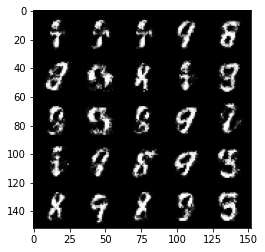

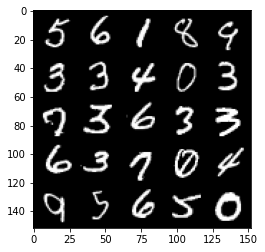

Step 26500: Generator loss: 2.8925006084442137, discriminator loss: 0.17915685351192953


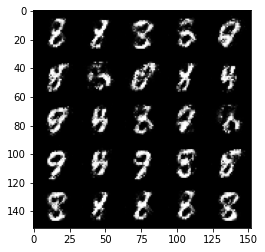

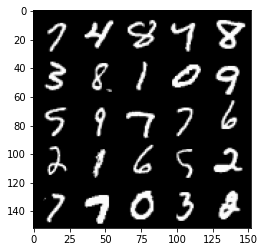

Step 27000: Generator loss: 3.0137985992431644, discriminator loss: 0.17573572438955298


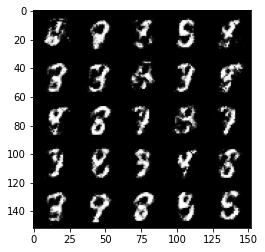

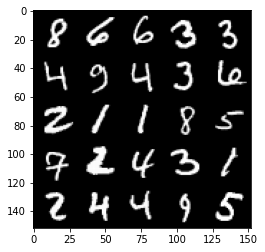

Step 27500: Generator loss: 2.928644522666933, discriminator loss: 0.18533153226971624


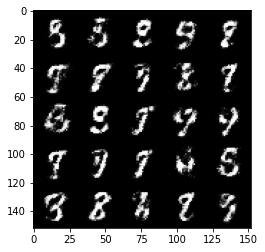

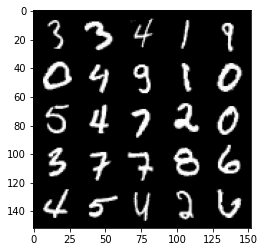

Step 28000: Generator loss: 2.9344888439178467, discriminator loss: 0.1842168049663306


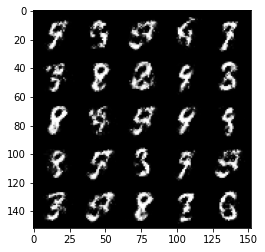

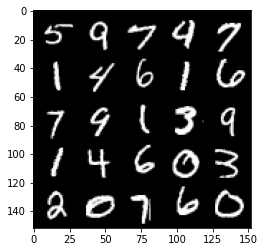

Step 28500: Generator loss: 2.7515598182678227, discriminator loss: 0.207047286748886


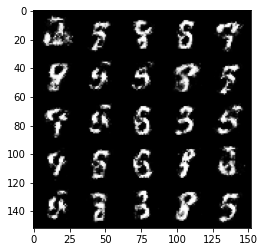

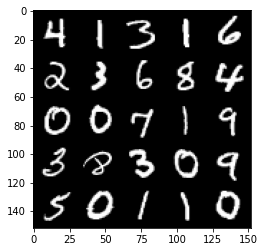

Step 29000: Generator loss: 2.841448788166047, discriminator loss: 0.19933658342063443


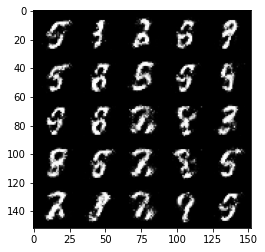

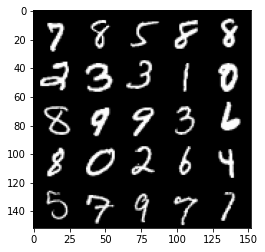

Step 29500: Generator loss: 2.6970963010787963, discriminator loss: 0.20799549229443048


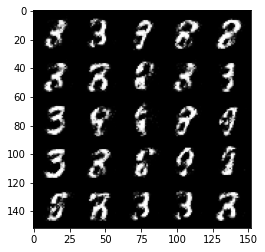

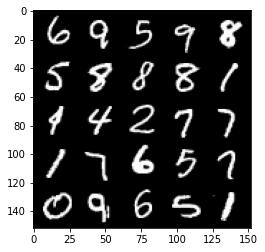

Step 30000: Generator loss: 2.7612494993209866, discriminator loss: 0.19497585996985453


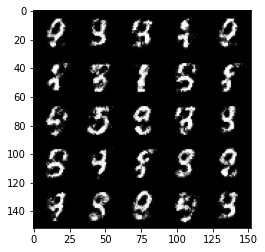

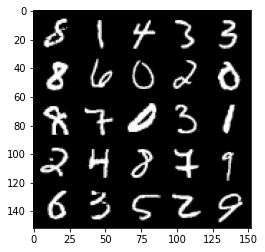

Step 30500: Generator loss: 2.6083900299072242, discriminator loss: 0.2200601470470428


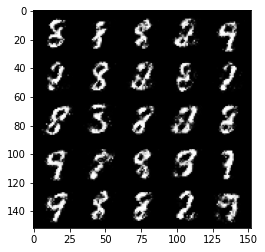

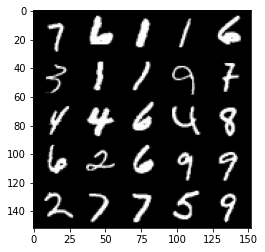

Step 31000: Generator loss: 2.7666863436698916, discriminator loss: 0.19198484109342104


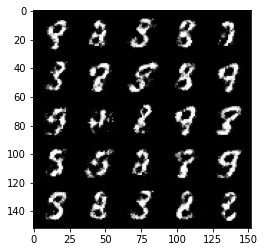

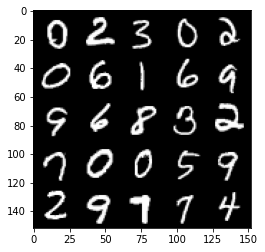

Step 31500: Generator loss: 2.7687890167236326, discriminator loss: 0.1989199610799552


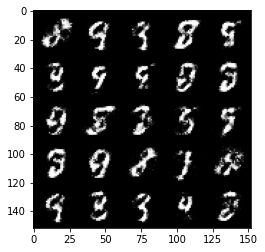

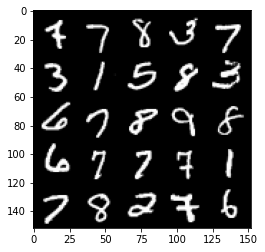

Step 32000: Generator loss: 2.645301213264467, discriminator loss: 0.2198318766653538


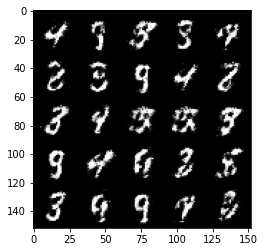

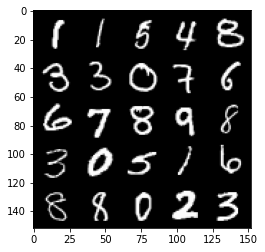

Step 32500: Generator loss: 2.5324638018608083, discriminator loss: 0.23060360202193264


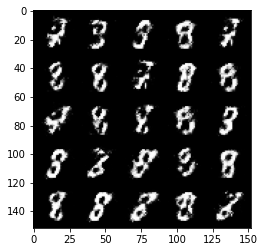

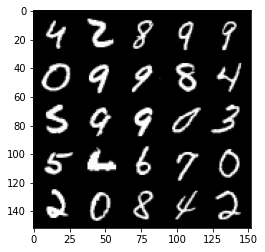

Step 33000: Generator loss: 2.550519269466399, discriminator loss: 0.2282682431638239


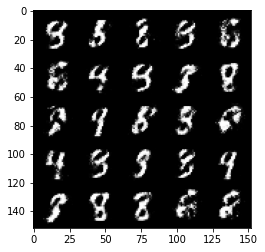

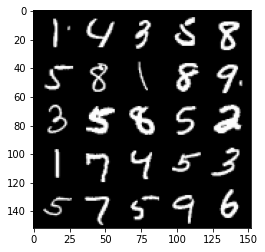

Step 33500: Generator loss: 2.436280393123627, discriminator loss: 0.2557612144947054


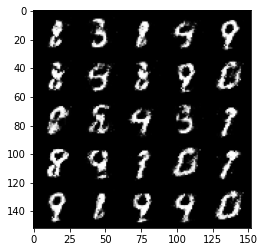

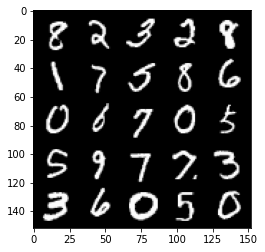

Step 34000: Generator loss: 2.4410930488109615, discriminator loss: 0.2462792884409427


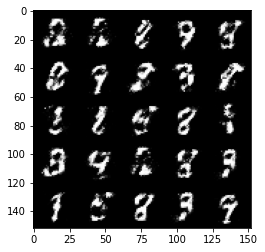

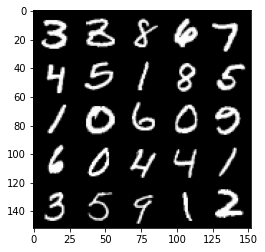

Step 34500: Generator loss: 2.506382523536686, discriminator loss: 0.2223696711808444


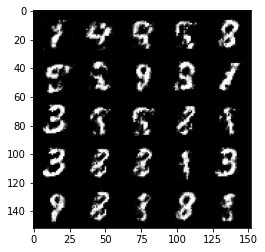

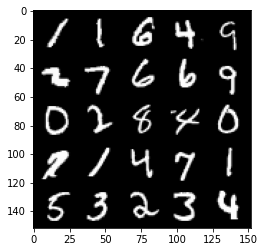

Step 35000: Generator loss: 2.5382758359909063, discriminator loss: 0.25025556710362434


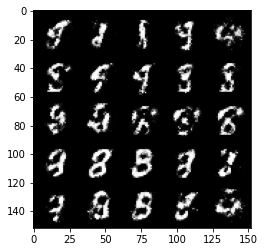

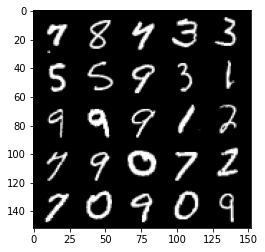

Step 35500: Generator loss: 2.4395901403427134, discriminator loss: 0.24288170745968818


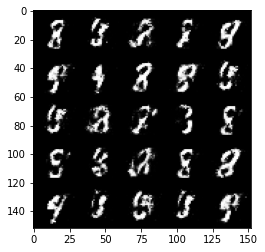

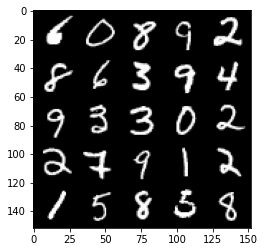

Step 36000: Generator loss: 2.5016295266151407, discriminator loss: 0.24367122781276682


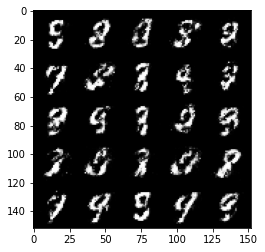

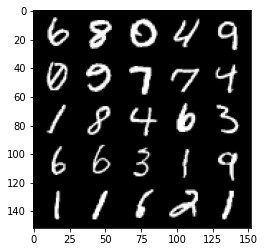

Step 36500: Generator loss: 2.3275959110259983, discriminator loss: 0.26874222227931055


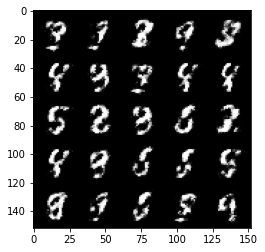

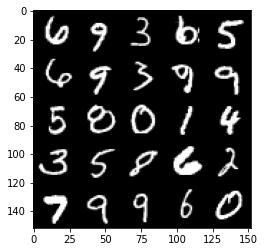

Step 37000: Generator loss: 2.4465619840621944, discriminator loss: 0.23966411739587778


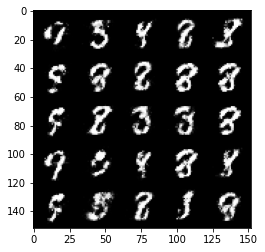

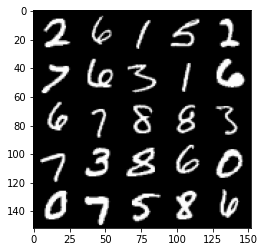

Step 37500: Generator loss: 2.300564683198929, discriminator loss: 0.2617366302311418


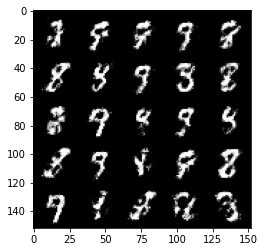

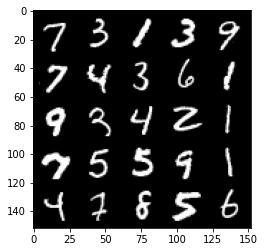

Step 38000: Generator loss: 2.441188303232193, discriminator loss: 0.24631320843100554


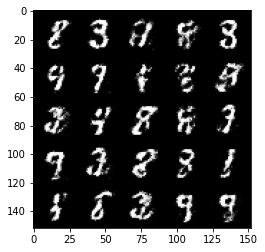

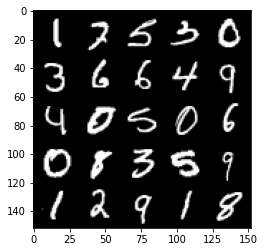

Step 38500: Generator loss: 2.3749954760074625, discriminator loss: 0.2489042741656305


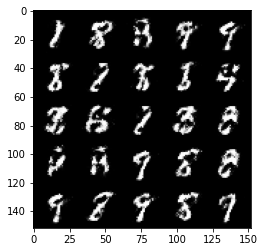

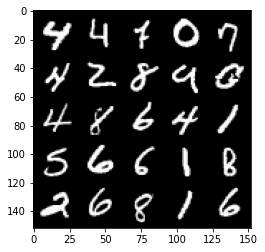

Step 39000: Generator loss: 2.3560781626701335, discriminator loss: 0.25462545195221886


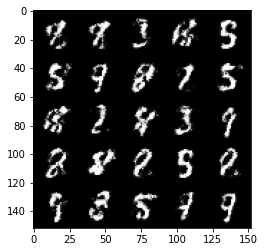

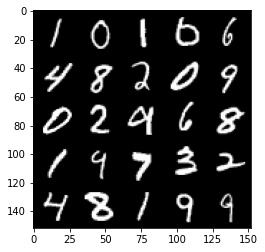

Step 39500: Generator loss: 2.292200540781023, discriminator loss: 0.2640586071312427


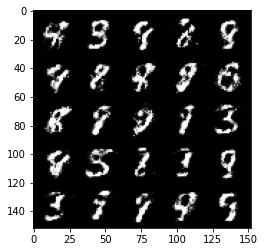

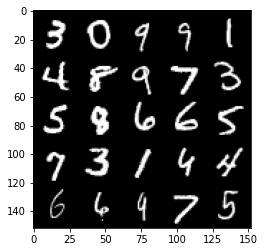

Step 40000: Generator loss: 2.351138748884198, discriminator loss: 0.2519478155970574


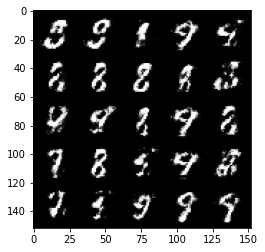

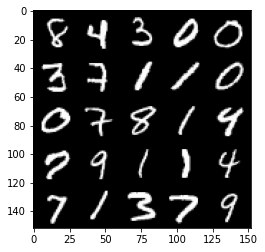

Step 40500: Generator loss: 2.3487639589309706, discriminator loss: 0.26273694068193465


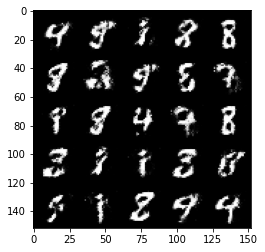

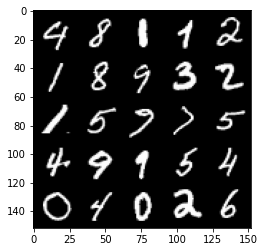

Step 41000: Generator loss: 2.3486175556182878, discriminator loss: 0.2660207959413527


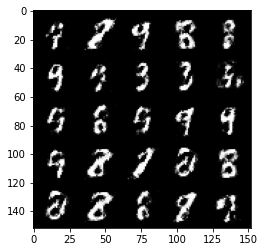

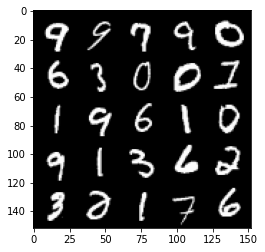

Step 41500: Generator loss: 2.324217710494996, discriminator loss: 0.256134920924902


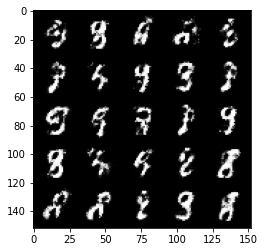

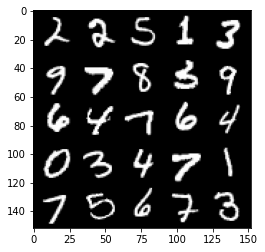

Step 42000: Generator loss: 2.412251457691197, discriminator loss: 0.2480566064715386


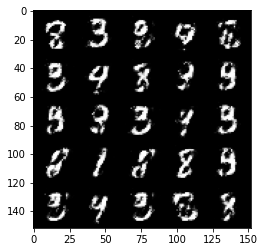

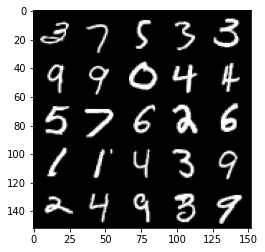

Step 42500: Generator loss: 2.330827017307283, discriminator loss: 0.2670627203583718


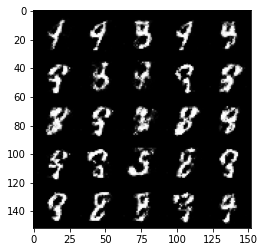

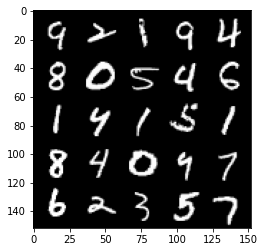

Step 43000: Generator loss: 2.139572374105452, discriminator loss: 0.2999019114673139


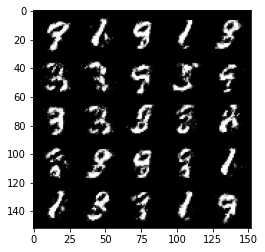

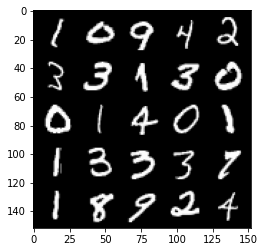

Step 43500: Generator loss: 2.266488335132599, discriminator loss: 0.26080720829963694


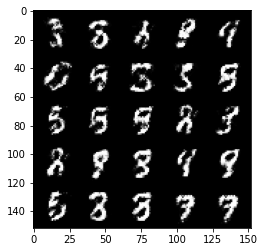

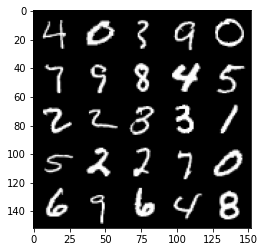

Step 44000: Generator loss: 2.2800135784149167, discriminator loss: 0.2649893157482147


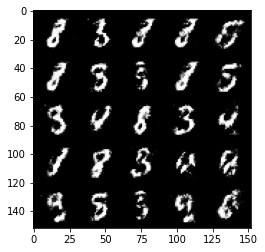

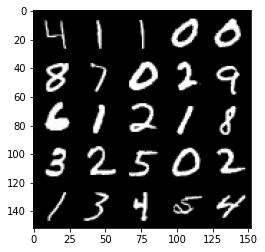

Step 44500: Generator loss: 2.221678533792496, discriminator loss: 0.27334275916218753


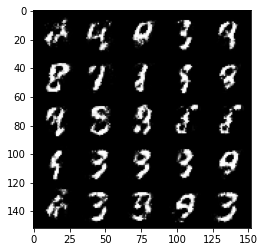

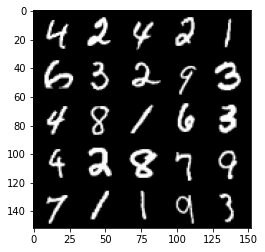

Step 45000: Generator loss: 2.2882277328968037, discriminator loss: 0.26007389011979104


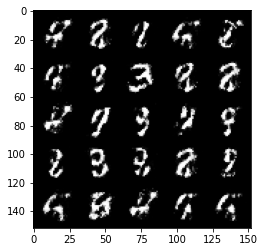

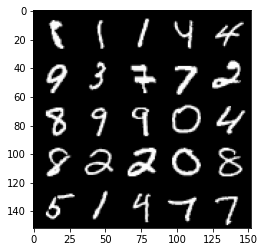

Step 45500: Generator loss: 2.3087931604385377, discriminator loss: 0.25555532664060576


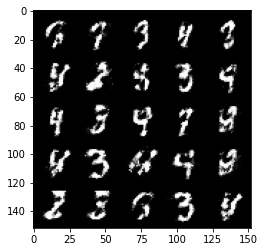

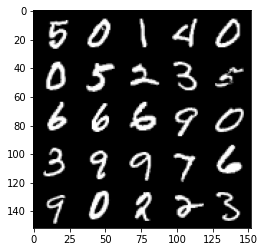

Step 46000: Generator loss: 2.177756223917007, discriminator loss: 0.29294426846504223


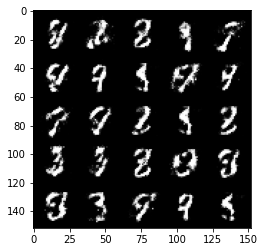

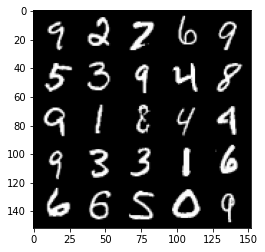

Step 46500: Generator loss: 2.1089619402885456, discriminator loss: 0.29235134556889536


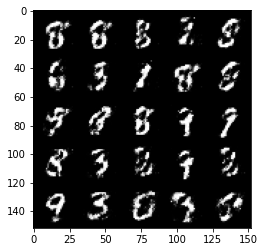

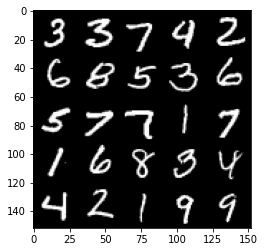

Step 47000: Generator loss: 2.028055442094802, discriminator loss: 0.31563786798715604


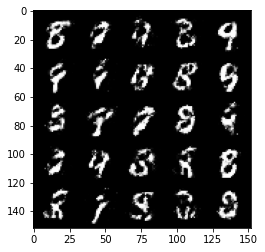

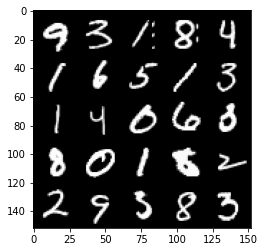

Step 47500: Generator loss: 2.0384875850677475, discriminator loss: 0.3087134230732921


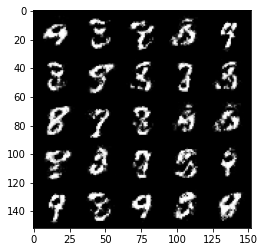

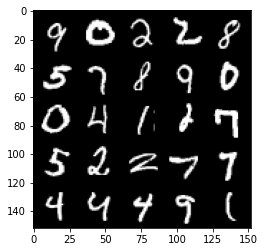

Step 48000: Generator loss: 2.133797660112381, discriminator loss: 0.29131301483511907


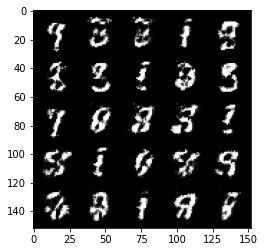

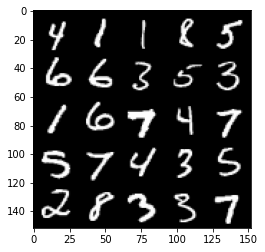

Step 48500: Generator loss: 2.041139248371125, discriminator loss: 0.30322680473327623


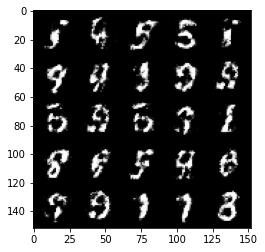

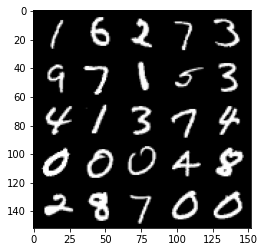

Step 49000: Generator loss: 2.0338014919757845, discriminator loss: 0.3081911505162717


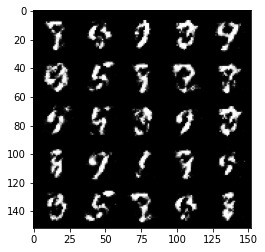

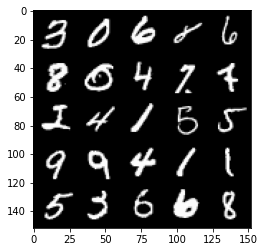

Step 49500: Generator loss: 2.0140504148006437, discriminator loss: 0.31494465059041976


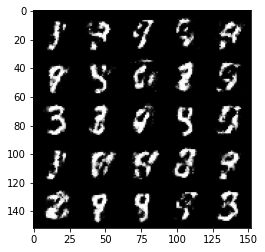

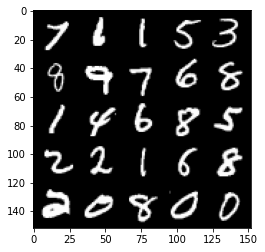

Step 50000: Generator loss: 2.0407007868289937, discriminator loss: 0.30571532469987867


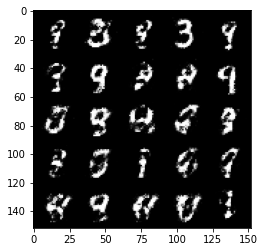

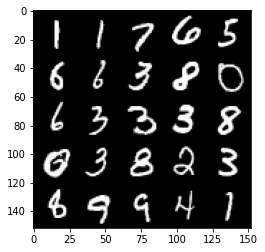

Step 50500: Generator loss: 1.9204849774837485, discriminator loss: 0.3312534560561179


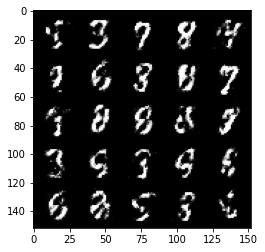

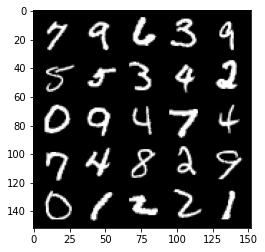

Step 51000: Generator loss: 1.8886181859970104, discriminator loss: 0.3352830386459825


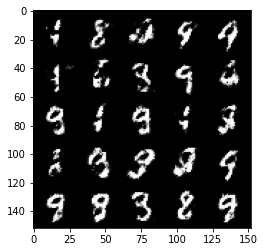

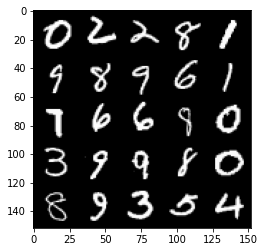

Step 51500: Generator loss: 1.9857086293697357, discriminator loss: 0.31334852555394177


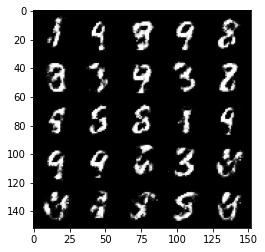

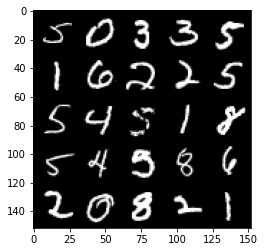

Step 52000: Generator loss: 1.8607389259338372, discriminator loss: 0.3400495824813842


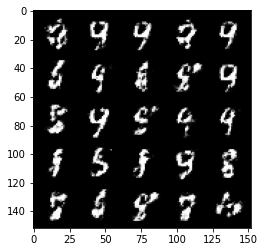

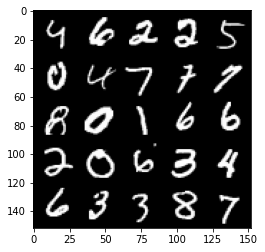

Step 52500: Generator loss: 1.9001398396492004, discriminator loss: 0.33123659572005265


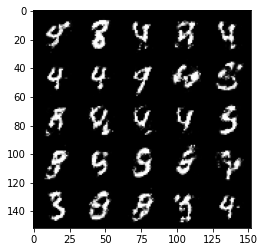

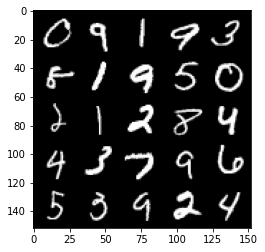

Step 53000: Generator loss: 1.998965258121489, discriminator loss: 0.30331076532602347


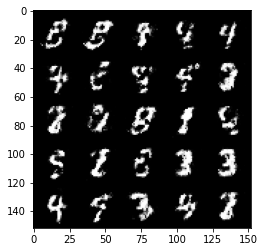

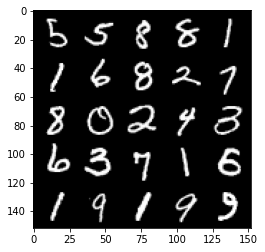

Step 53500: Generator loss: 2.021055014133453, discriminator loss: 0.30332827317714667


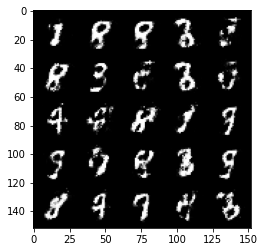

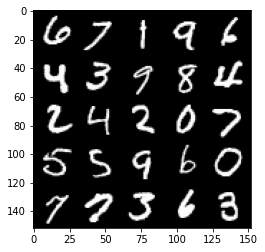

Step 54000: Generator loss: 1.9033332474231723, discriminator loss: 0.33792819646000877


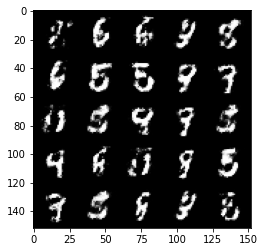

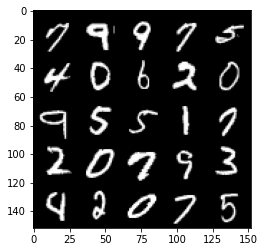

Step 54500: Generator loss: 1.9133502416610715, discriminator loss: 0.3161780574619772


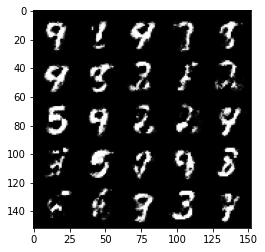

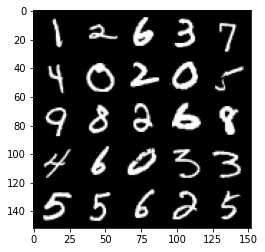

Step 55000: Generator loss: 1.8383393254280096, discriminator loss: 0.34494355618953715


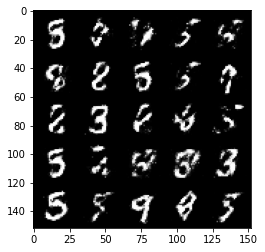

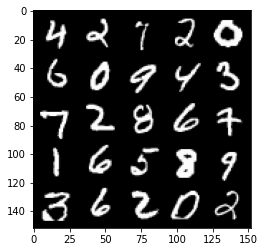

Step 55500: Generator loss: 1.8086819875240328, discriminator loss: 0.34568697875738114


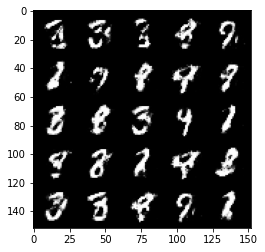

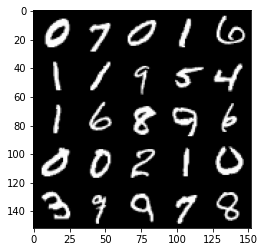

Step 56000: Generator loss: 1.8446066920757314, discriminator loss: 0.33769017747044583


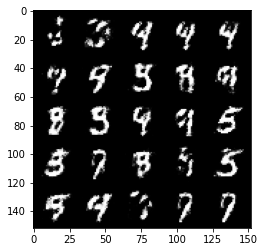

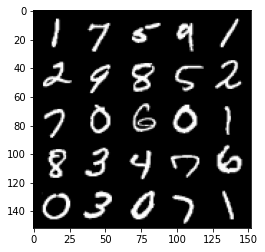

Step 56500: Generator loss: 1.873181422948837, discriminator loss: 0.33462968462705606


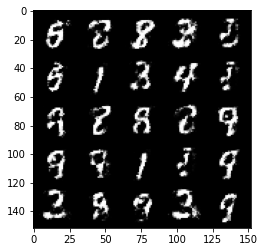

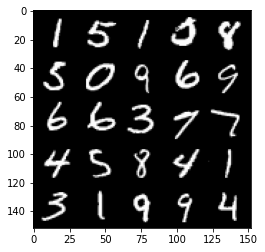

Step 57000: Generator loss: 1.8644374198913585, discriminator loss: 0.3345431542694568


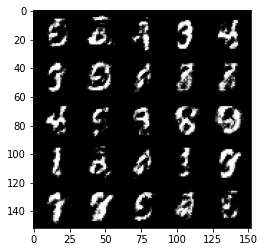

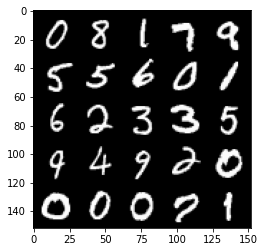

Step 57500: Generator loss: 1.8959936542510996, discriminator loss: 0.31672547850012733


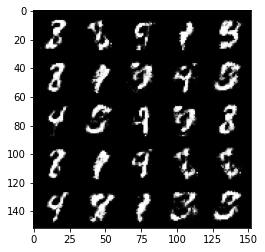

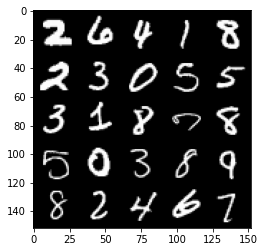

Step 58000: Generator loss: 1.8718242449760434, discriminator loss: 0.32966196581721313


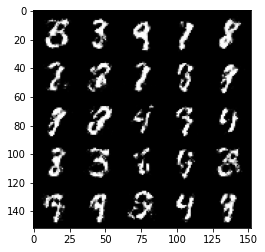

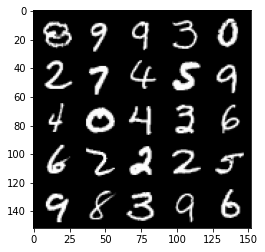

Step 58500: Generator loss: 1.8608616776466353, discriminator loss: 0.341204539299011


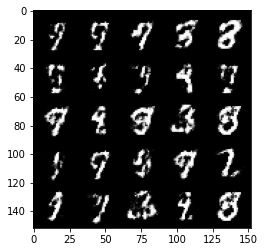

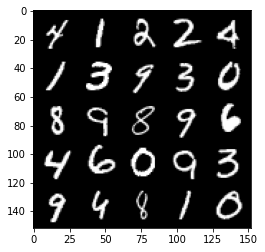

Step 59000: Generator loss: 1.7788360352516173, discriminator loss: 0.3487386809289457


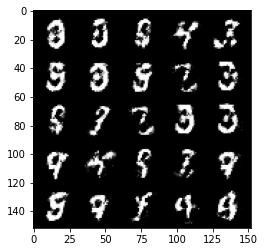

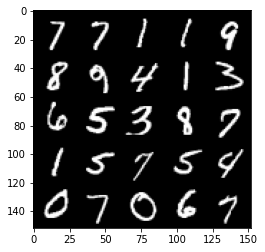

Step 59500: Generator loss: 1.876323019981383, discriminator loss: 0.32301712870597843


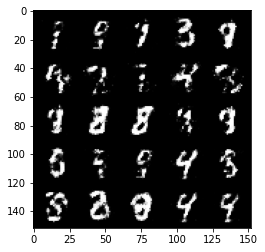

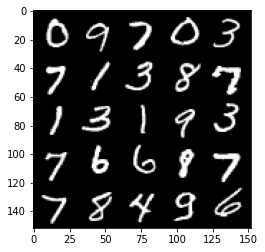

Step 60000: Generator loss: 1.7923619768619516, discriminator loss: 0.3517600582540038


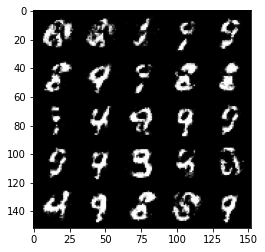

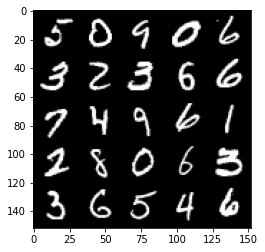

Step 60500: Generator loss: 1.6563970973491677, discriminator loss: 0.38724253726005564


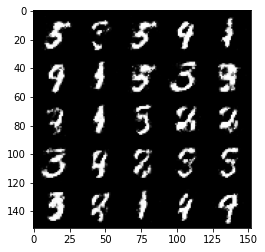

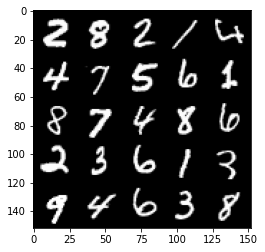

Step 61000: Generator loss: 1.6977221837043759, discriminator loss: 0.3662248471975326


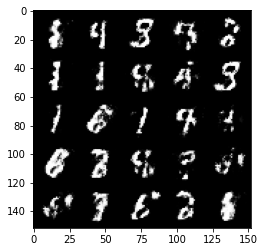

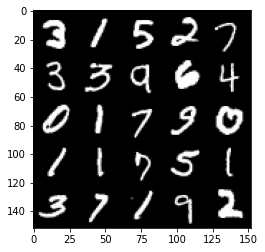

Step 61500: Generator loss: 1.638585803031919, discriminator loss: 0.37999595034122474


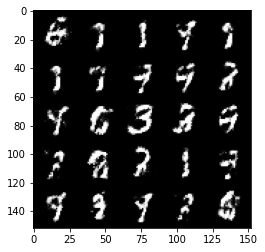

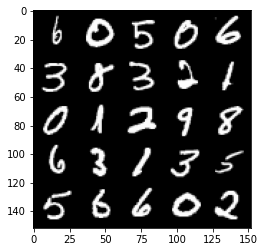

Step 62000: Generator loss: 1.664812445640564, discriminator loss: 0.3625828297138213


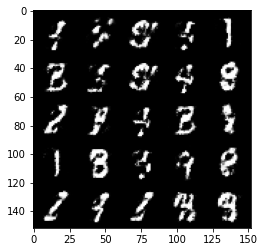

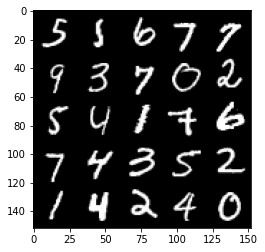

Step 62500: Generator loss: 1.7434302523136143, discriminator loss: 0.36211428642272936


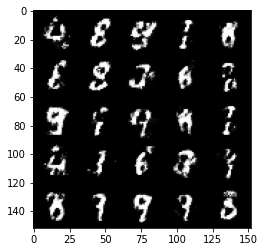

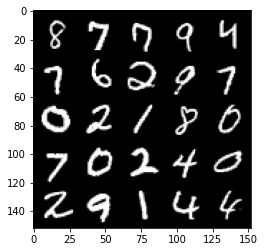

Step 63000: Generator loss: 1.576693976402284, discriminator loss: 0.41330043411254913


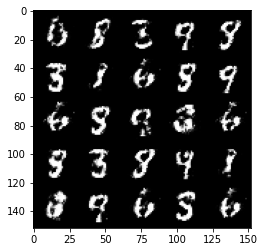

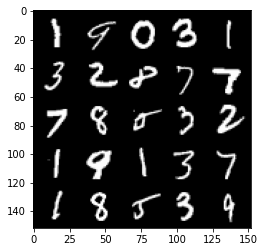

Step 63500: Generator loss: 1.5728692026138318, discriminator loss: 0.40087764275073984


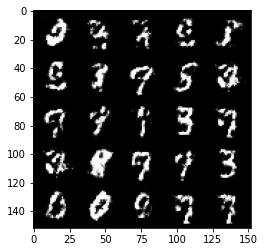

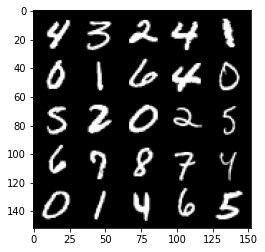

Step 64000: Generator loss: 1.6859474654197706, discriminator loss: 0.3762676312923432


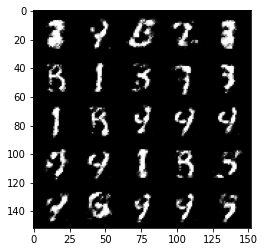

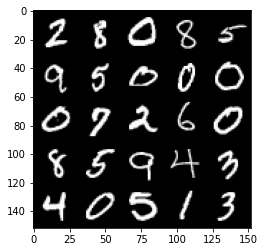

Step 64500: Generator loss: 1.592246029615403, discriminator loss: 0.3935672931075098


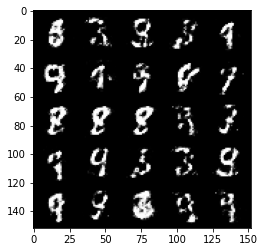

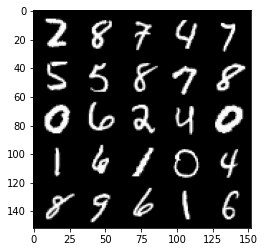

Step 65000: Generator loss: 1.5859916384220132, discriminator loss: 0.3935084002614021


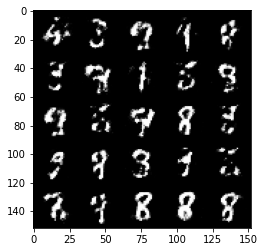

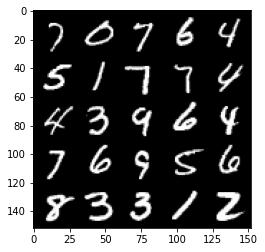

Step 65500: Generator loss: 1.599801477909087, discriminator loss: 0.38654483860731115


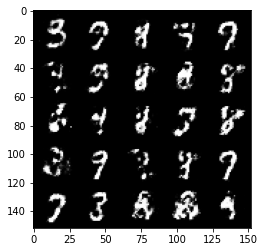

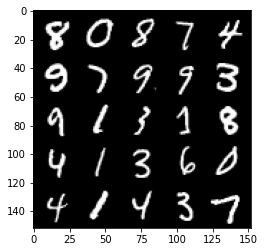

Step 66000: Generator loss: 1.621217664480209, discriminator loss: 0.38952433228492767


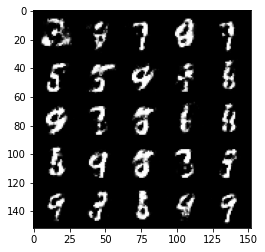

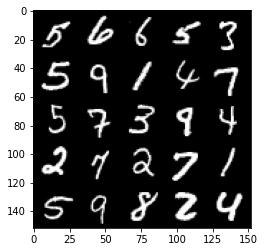

Step 66500: Generator loss: 1.6048961360454568, discriminator loss: 0.39028061354160287


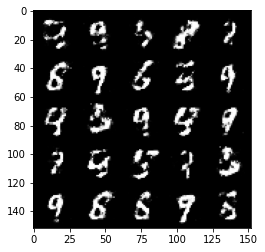

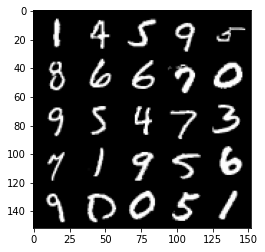

Step 67000: Generator loss: 1.6611767940521227, discriminator loss: 0.3821350205540654


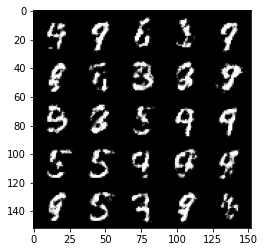

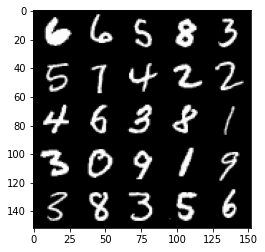

Step 67500: Generator loss: 1.5283792669773097, discriminator loss: 0.4206762320399286


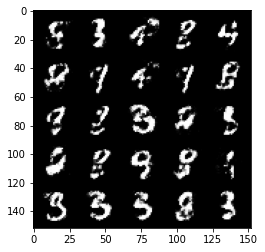

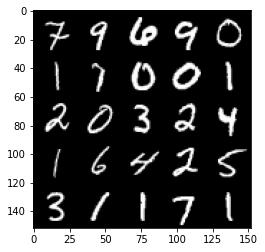

Step 68000: Generator loss: 1.5884995539188393, discriminator loss: 0.3923454463481906


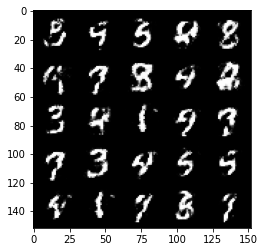

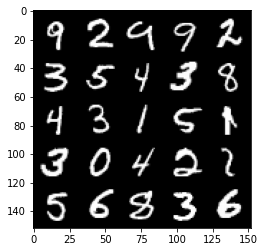

Step 68500: Generator loss: 1.545196150302886, discriminator loss: 0.40104097503423736


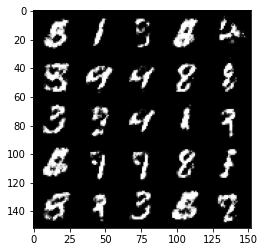

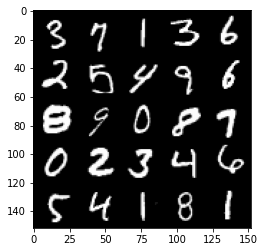

Step 69000: Generator loss: 1.5315757658481601, discriminator loss: 0.39666629433631945


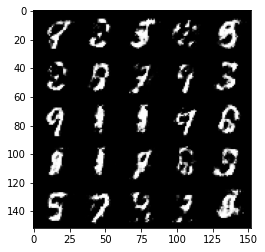

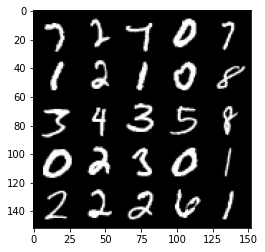

Step 69500: Generator loss: 1.5705039322376264, discriminator loss: 0.40670046663284315


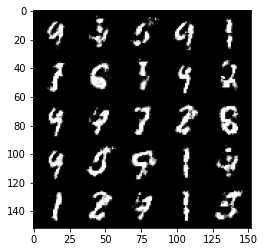

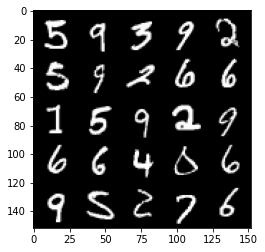

Step 70000: Generator loss: 1.5235382184982302, discriminator loss: 0.41910488516092304


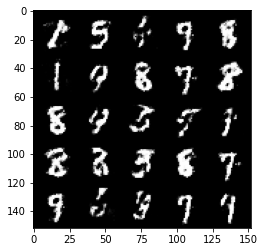

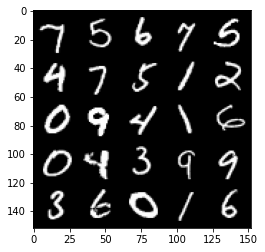

Step 70500: Generator loss: 1.4771722276210788, discriminator loss: 0.41396531838178613


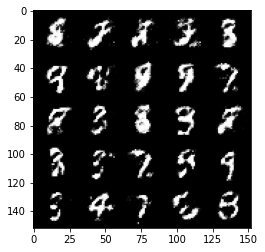

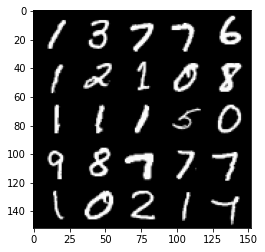

Step 71000: Generator loss: 1.6176926836967471, discriminator loss: 0.37559813654422786


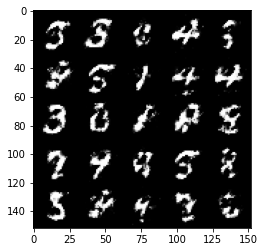

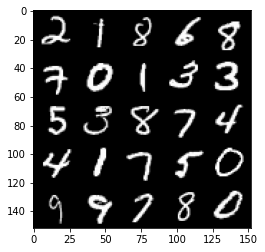

Step 71500: Generator loss: 1.610638355731963, discriminator loss: 0.3852104274630545


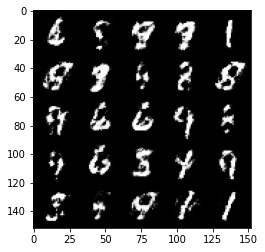

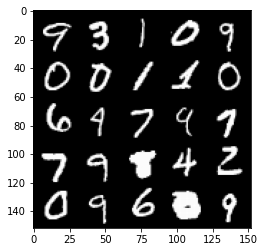

Step 72000: Generator loss: 1.5468728773593907, discriminator loss: 0.41346678656339647


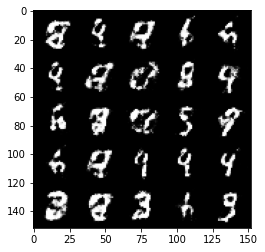

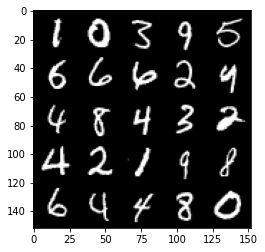

Step 72500: Generator loss: 1.4754925966262813, discriminator loss: 0.41478224629163735


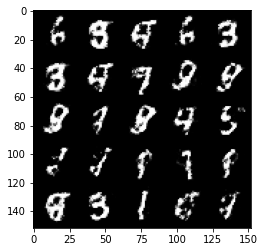

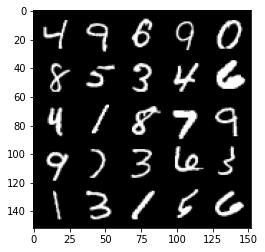

Step 73000: Generator loss: 1.5977141463756575, discriminator loss: 0.3769919019341472


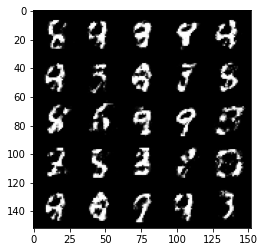

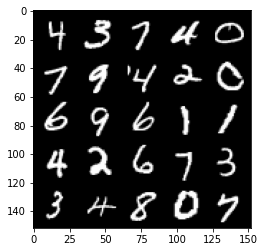

Step 73500: Generator loss: 1.4770428240299196, discriminator loss: 0.4300713965296743


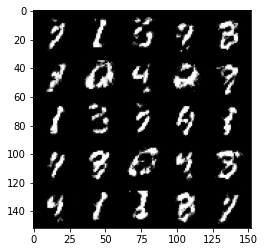

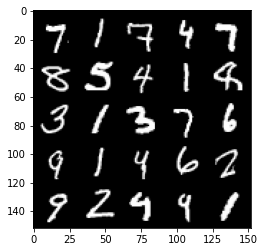

Step 74000: Generator loss: 1.5786050732135783, discriminator loss: 0.3904761579036711


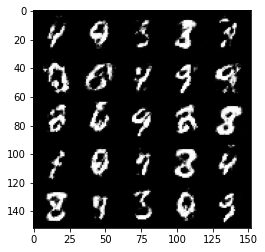

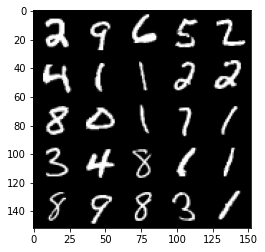

Step 74500: Generator loss: 1.5626910383701333, discriminator loss: 0.39061628818511995


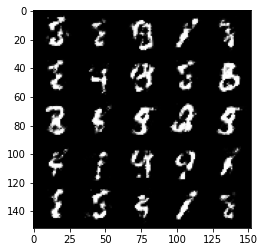

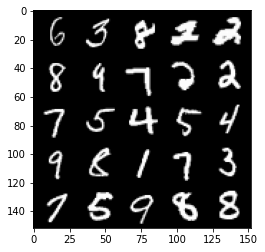

Step 75000: Generator loss: 1.4693946044445014, discriminator loss: 0.42111119472980507


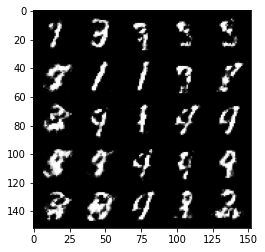

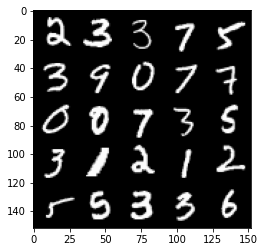

Step 75500: Generator loss: 1.4242907490730279, discriminator loss: 0.44235532248020176


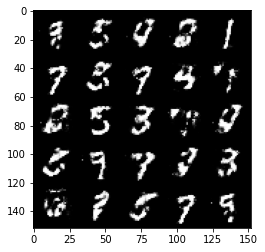

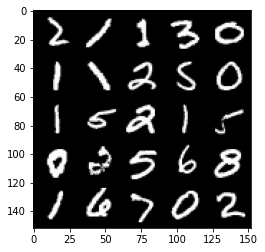

Step 76000: Generator loss: 1.4330348343849186, discriminator loss: 0.4304132507443435


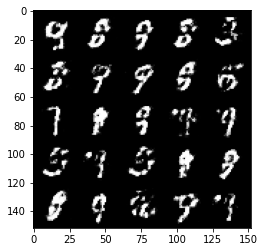

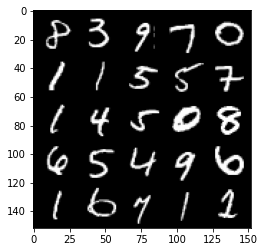

Step 76500: Generator loss: 1.4645470657348636, discriminator loss: 0.43068234908580794


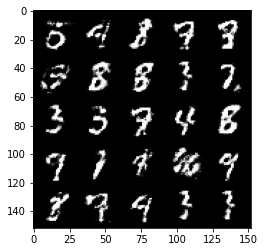

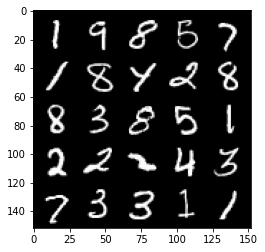

Step 77000: Generator loss: 1.475232347011567, discriminator loss: 0.41534475755691525


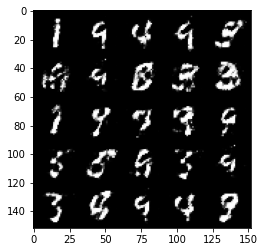

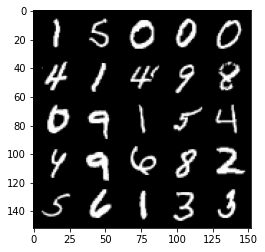

Step 77500: Generator loss: 1.457245173931122, discriminator loss: 0.4242904275059697


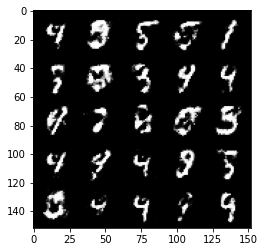

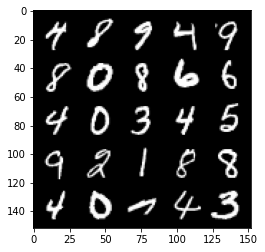

Step 78000: Generator loss: 1.3459126732349387, discriminator loss: 0.45762006121873827


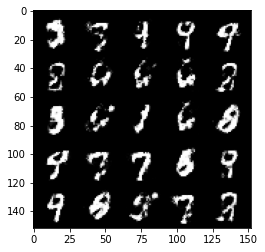

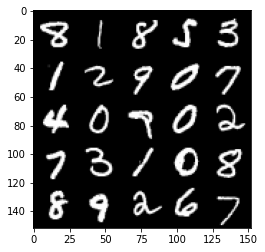

Step 78500: Generator loss: 1.3976215219497676, discriminator loss: 0.435738861858844


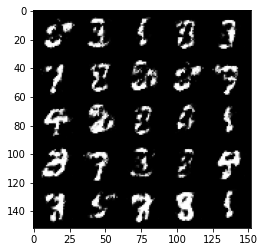

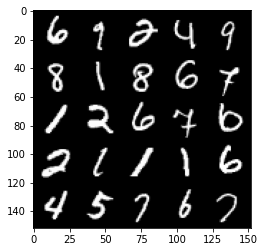

Step 79000: Generator loss: 1.3632877895832054, discriminator loss: 0.44793039286136627


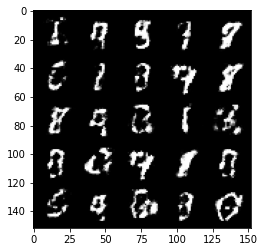

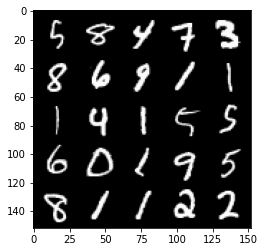

Step 79500: Generator loss: 1.4577542920112612, discriminator loss: 0.4239669995903969


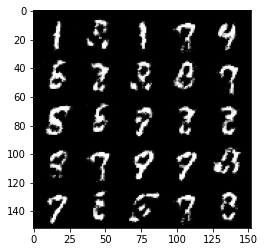

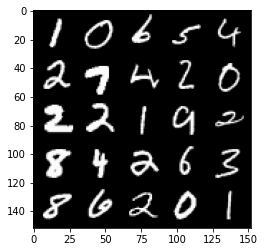

Step 80000: Generator loss: 1.4022094495296467, discriminator loss: 0.44535998642444624


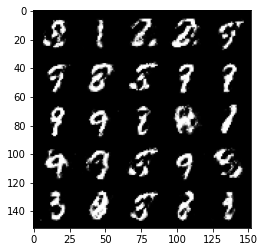

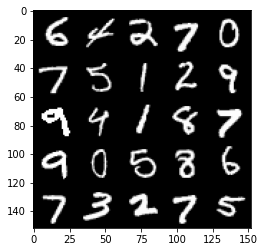

Step 80500: Generator loss: 1.3788964812755589, discriminator loss: 0.44883994853496545


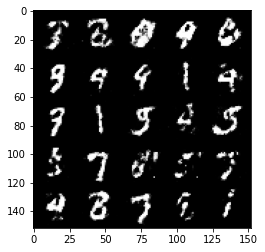

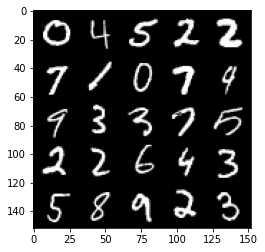

Step 81000: Generator loss: 1.2734055798053738, discriminator loss: 0.47590489411354103


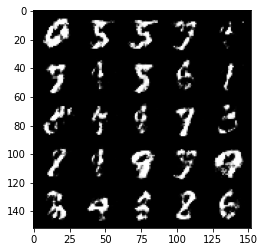

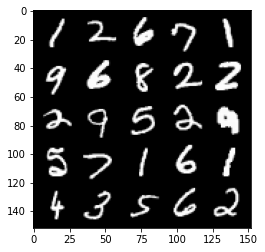

Step 81500: Generator loss: 1.3168337433338158, discriminator loss: 0.4652376326918598


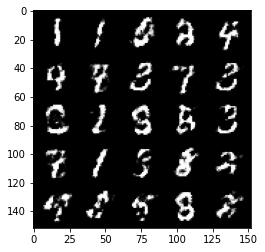

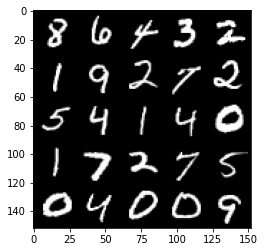

Step 82000: Generator loss: 1.2330706784725187, discriminator loss: 0.48949315732717485


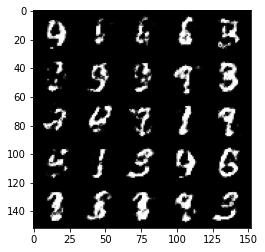

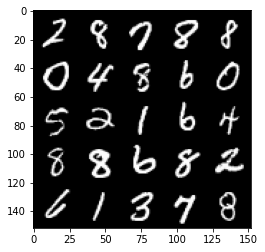

Step 82500: Generator loss: 1.3201924633979782, discriminator loss: 0.46717730051279044


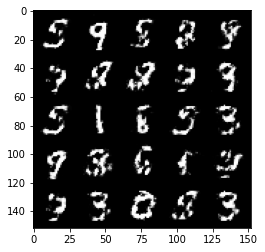

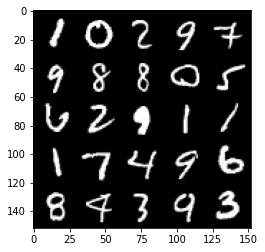

Step 83000: Generator loss: 1.2993087809085833, discriminator loss: 0.4682136688232419


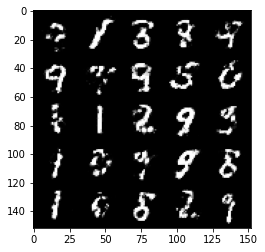

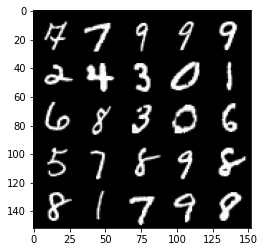

Step 83500: Generator loss: 1.2799635705947885, discriminator loss: 0.4855652927756311


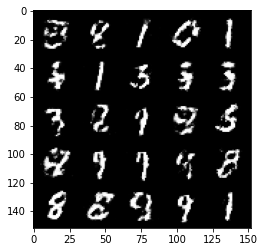

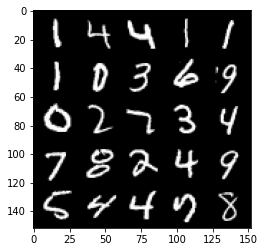

Step 84000: Generator loss: 1.257929451465607, discriminator loss: 0.49517465519905124


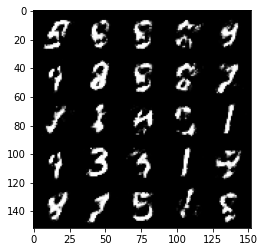

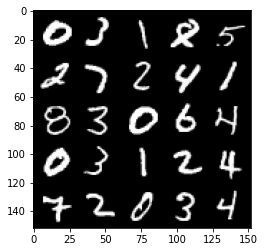

Step 84500: Generator loss: 1.293393343925475, discriminator loss: 0.46385315787792186


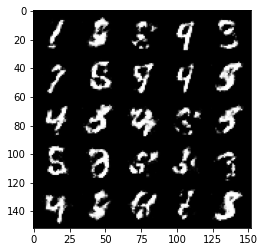

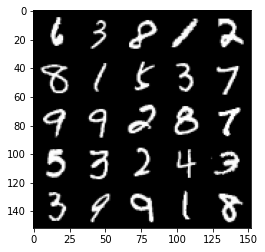

Step 85000: Generator loss: 1.277967584371566, discriminator loss: 0.4670021996498107


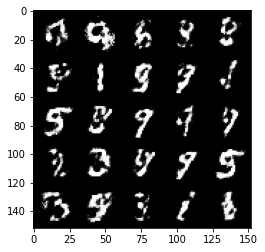

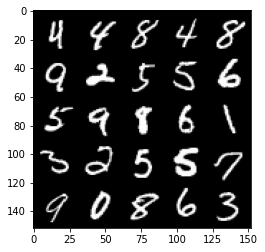

Step 85500: Generator loss: 1.2142273241281512, discriminator loss: 0.4946272706985476


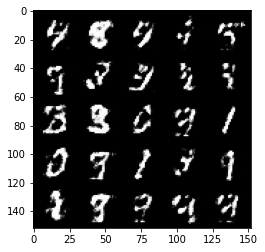

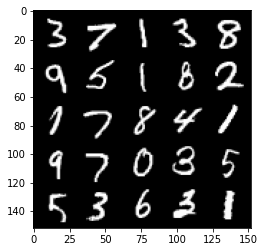

Step 86000: Generator loss: 1.2883015348911289, discriminator loss: 0.4520664393305775


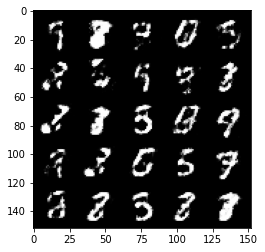

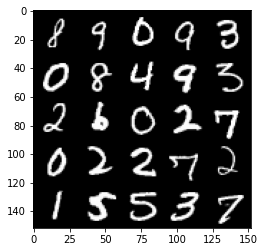

Step 86500: Generator loss: 1.2600330131053925, discriminator loss: 0.4677281079292299


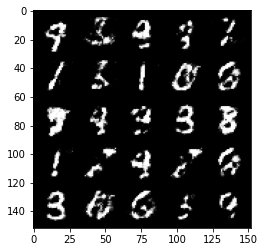

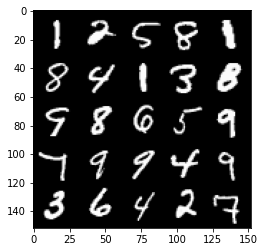

Step 87000: Generator loss: 1.3459872946739202, discriminator loss: 0.4443626622557644


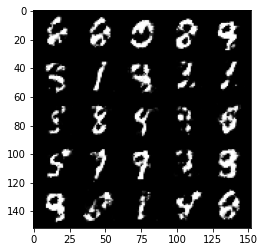

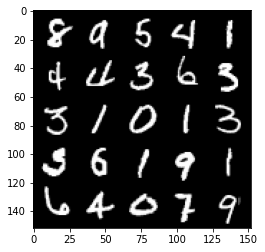

Step 87500: Generator loss: 1.272157223463059, discriminator loss: 0.46882045578956566


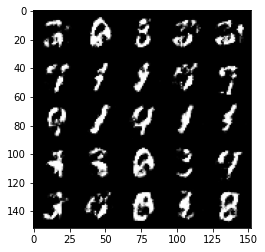

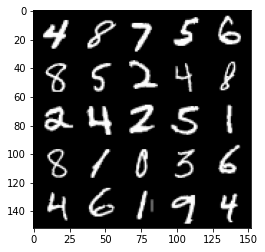

Step 88000: Generator loss: 1.3843172483444215, discriminator loss: 0.43466326344013223


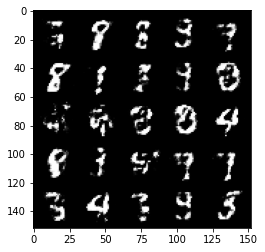

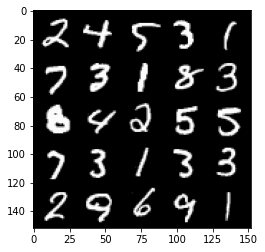

Step 88500: Generator loss: 1.338063215732575, discriminator loss: 0.45908790498971924


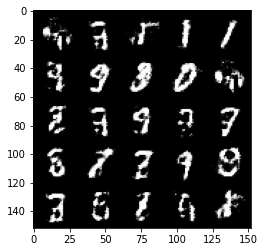

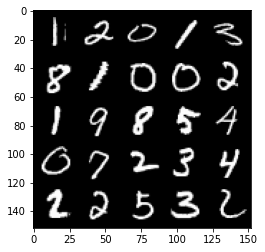

Step 89000: Generator loss: 1.2972491281032565, discriminator loss: 0.47469039463996904


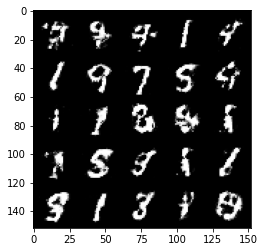

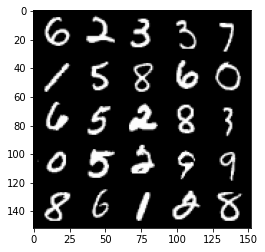

Step 89500: Generator loss: 1.2424201464653006, discriminator loss: 0.4933089466691018


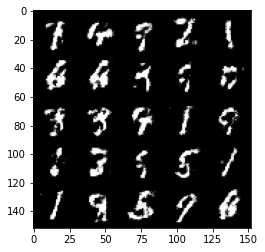

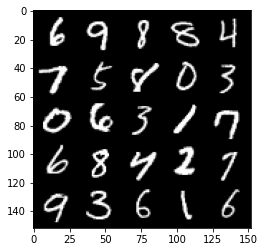

Step 90000: Generator loss: 1.2947275221347814, discriminator loss: 0.4720126933455471


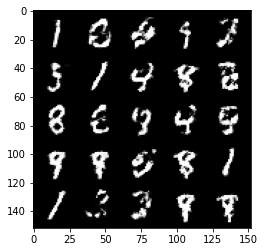

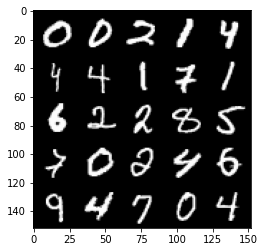

Step 90500: Generator loss: 1.2190222504138937, discriminator loss: 0.49845817971229556


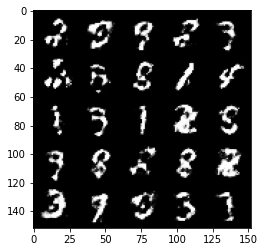

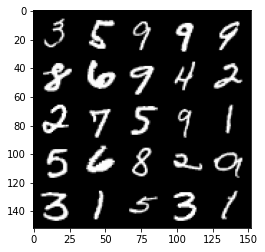

Step 91000: Generator loss: 1.1923909537792206, discriminator loss: 0.4981822639107706


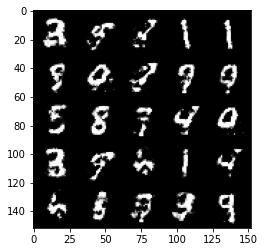

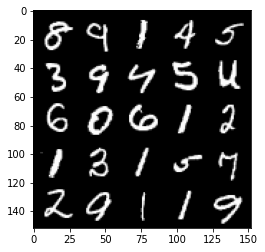

Step 91500: Generator loss: 1.2856030278205863, discriminator loss: 0.4645277067422866


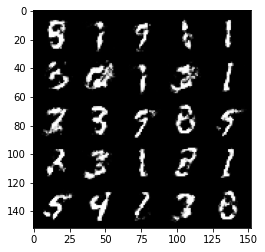

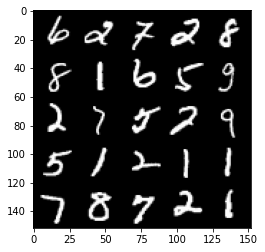

Step 92000: Generator loss: 1.265739061355591, discriminator loss: 0.4737199323177339


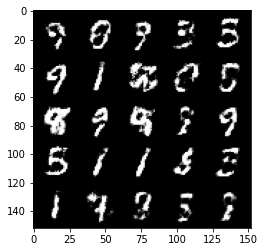

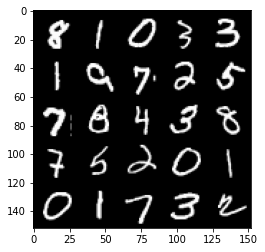

Step 92500: Generator loss: 1.2693664915561684, discriminator loss: 0.47482417500019086


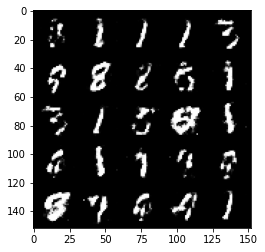

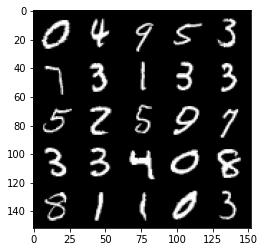

Step 93000: Generator loss: 1.2114072773456581, discriminator loss: 0.49221934998035394


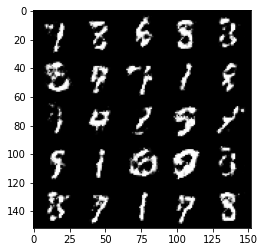

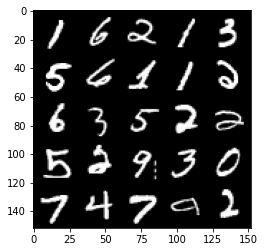

Step 93500: Generator loss: 1.115564743518829, discriminator loss: 0.5288963687419896


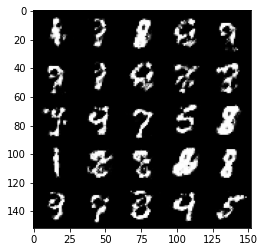

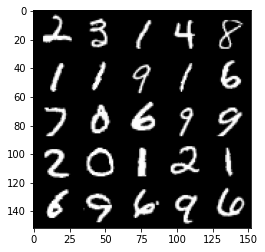

In [21]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True
gen_loss = False
for epoch in range(n_epochs):
  for real,_ in tqdm(dataloader):
    cur_batch_size = len(real)
    real = real.view(cur_batch_size,-1).to(device)

    ### Update discriminator ###
    # Zero out the gradients before backpropagation
    disc_opt.zero_grad()

    # Calculate discriminator loss
    disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

    # Update gradients
    disc_loss.backward(retain_graph=True)

    # Update optimizer
    disc_opt.step()

    # For testing purposes, to keep track of the generator weights
    if test_generator:
      old_generator_weights = gen.gen[0][0].weight.detach().clone
    
    # Update generator
    # Zero out the gradients.
    gen_opt.zero_grad()

    # Calculate the generator loss, assigning it to gen_loss.
    gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)

    # Backprop through the generator: update the gradients and optimizer.
    gen_loss.backward()
    
    # Update optimizer
    gen_opt.step()

    if test_generator:
      old_generator_weights = gen.gen[0][0].weight.detach().clone()
    
    # Keep track of the average discriminator loss
    mean_discriminator_loss += disc_loss.item() / display_step

    # Keep track of the average generator loss
    mean_generator_loss += gen_loss.item() / display_step

     ### Visualization code ###
    if cur_step % display_step == 0 and cur_step > 0:
      print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
      fake_noise = get_noise(cur_batch_size, z_dim, device=device)
      fake = gen(fake_noise)
      show_tensor_images(fake)
      show_tensor_images(real)
      mean_generator_loss = 0
      mean_discriminator_loss = 0
    cur_step += 1



